<a href="https://colab.research.google.com/github/yashfirkedata/Cotton_Disease_prediction/blob/main/Homestays_data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**EDA and Modelling on Homestays Data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np

data = pd.read_csv("/content/drive/MyDrive/Homestays_Data.csv")
data.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,...,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201,1.0,1.0
1,6304928,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,...,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,https://a0.muscache.com/im/pictures/348a55fe-4...,10019,3.0,3.0
2,7919400,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,...,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,https://a0.muscache.com/im/pictures/6fae5362-9...,10027,1.0,3.0
3,13418779,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,...,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,https://a0.muscache.com/im/pictures/72208dad-9...,94117,2.0,2.0
4,3808709,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,...,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,NaN,20009,0.0,1.0


#Basic Exploration

In [ ]:
data.columns

Index(['id', 'log_price', 'property_type', 'room_type', 'amenities',
       'accommodates', 'bathrooms', 'bed_type', 'cancellation_policy',
       'cleaning_fee', 'city', 'description', 'first_review',
       'host_has_profile_pic', 'host_identity_verified', 'host_response_rate',
       'host_since', 'instant_bookable', 'last_review', 'latitude',
       'longitude', 'name', 'neighbourhood', 'number_of_reviews',
       'review_scores_rating', 'thumbnail_url', 'zipcode', 'bedrooms', 'beds'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74111 entries, 0 to 74110
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      74111 non-null  int64  
 1   log_price               74111 non-null  float64
 2   property_type           74111 non-null  object 
 3   room_type               74111 non-null  object 
 4   amenities               74111 non-null  object 
 5   accommodates            74111 non-null  int64  
 6   bathrooms               73911 non-null  float64
 7   bed_type                74111 non-null  object 
 8   cancellation_policy     74111 non-null  object 
 9   cleaning_fee            74111 non-null  bool   
 10  city                    74111 non-null  object 
 11  description             74111 non-null  object 
 12  first_review            58247 non-null  object 
 13  host_has_profile_pic    73923 non-null  object 
 14  host_identity_verified  73923 non-null

In [ ]:
data.describe()

,id,log_price,accommodates,bathrooms,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
count,7.411100e+04,74111.000000,74111.000000,73911.000000,74111.000000,74111.000000,74111.000000,57389.000000,74020.000000,73980.000000
mean,1.126662e+07,4.782069,3.155146,1.235263,38.445958,-92.397525,20.900568,94.067365,1.265793,1.710868
std,6.081735e+06,0.717394,2.153589,0.582044,3.080167,21.705322,37.828641,7.836556,0.852143,1.254142
min,3.440000e+02,0.000000,1.000000,0.000000,33.338905,-122.511500,0.000000,20.000000,0.000000,0.000000
25%,6.261964e+06,4.317488,2.000000,1.000000,34.127908,-118.342374,1.000000,92.000000,1.000000,1.000000
50%,1.225415e+07,4.709530,2.000000,1.000000,40.662138,-76.996965,6.000000,96.000000,1.000000,1.000000
75%,1.640226e+07,5.220356,4.000000,1.000000,40.746096,-73.954660,23.000000,100.000000,1.000000,2.000000
max,2.123090e+07,7.600402,16.000000,8.000000,42.390437,-70.985047,605.000000,100.000000,10.000000,18.000000


In [ ]:
data.duplicated().any()

False

In [ ]:
data.isna().sum()

id                            0
log_price                     0
property_type                 0
room_type                     0
amenities                     0
accommodates                  0
bathrooms                   200
bed_type                      0
cancellation_policy           0
cleaning_fee                  0
city                          0
description                   0
first_review              15864
host_has_profile_pic        188
host_identity_verified      188
host_response_rate        18299
host_since                  188
instant_bookable              0
last_review               15827
latitude                      0
longitude                     0
name                          0
neighbourhood              6872
number_of_reviews             0
review_scores_rating      16722
thumbnail_url              8216
zipcode                     966
bedrooms                     91
beds                        131
dtype: int64

In [ ]:
data.dtypes

id                          int64
log_price                 float64
property_type              object
room_type                  object
amenities                  object
accommodates                int64
bathrooms                 float64
bed_type                   object
cancellation_policy        object
cleaning_fee                 bool
city                       object
description                object
first_review               object
host_has_profile_pic       object
host_identity_verified     object
host_response_rate         object
host_since                 object
instant_bookable           object
last_review                object
latitude                  float64
longitude                 float64
name                       object
neighbourhood              object
number_of_reviews           int64
review_scores_rating      float64
thumbnail_url              object
zipcode                    object
bedrooms                  float64
beds                      float64
dtype: object

In [ ]:
cat_columns_data = data.select_dtypes(include=['object'])
cat_columns_data.head()

,property_type,room_type,amenities,bed_type,cancellation_policy,city,description,first_review,host_has_profile_pic,host_identity_verified,host_response_rate,host_since,instant_bookable,last_review,name,neighbourhood,thumbnail_url,zipcode
0,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",Real Bed,strict,NYC,"Beautiful, sunlit brownstone 1-bedroom in the ...",6/18/2016,t,t,NaN,3/26/2012,f,7/18/2016,Beautiful brownstone 1-bedroom,Brooklyn Heights,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201
1,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",Real Bed,strict,NYC,Enjoy travelling during your stay in Manhattan...,8/5/2017,t,f,100%,6/19/2017,t,9/23/2017,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,https://a0.muscache.com/im/pictures/348a55fe-4...,10019
2,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",Real Bed,moderate,NYC,The Oasis comes complete with a full backyard ...,4/30/2017,t,t,100%,10/25/2016,t,9/14/2017,The Garden Oasis,Harlem,https://a0.muscache.com/im/pictures/6fae5362-9...,10027
3,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",Real Bed,flexible,SF,This light-filled home-away-from-home is super...,NaN,t,t,NaN,4/19/2015,f,NaN,Beautiful Flat in the Heart of SF!,Lower Haight,https://a0.muscache.com/im/pictures/72208dad-9...,94117
4,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",Real Bed,moderate,DC,"Cool, cozy, and comfortable studio located in ...",5/12/2015,t,t,100%,3/1/2015,t,1/22/2017,Great studio in midtown DC,Columbia Heights,NaN,20009


In [ ]:
numerical_columns_data = data.select_dtypes(include=['int64', 'float64'])
numerical_columns_data.head()

,id,log_price,accommodates,bathrooms,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
0,6901257,5.010635,3,1.0,40.696524,-73.991617,2,100.0,1.0,1.0
1,6304928,5.129899,7,1.0,40.766115,-73.989040,6,93.0,3.0,3.0
2,7919400,4.976734,5,1.0,40.808110,-73.943756,10,92.0,1.0,3.0
3,13418779,6.620073,4,1.0,37.772004,-122.431619,0,NaN,2.0,2.0
4,3808709,4.744932,2,1.0,38.925627,-77.034596,4,40.0,0.0,1.0


Checking for the Unique values in categorical columns and the count which will help us to model and encode in future

In [ ]:
BOLD = '\033[1m'
RESET = '\033[0m'

for column in cat_columns_data.columns:
    print(f"{BOLD}Unique Values of {column} are:{RESET}")
    print(f"{data[column].unique()}")
    print(f"{BOLD}No of unique values {data[column].nunique()}{RESET}")
    print("\n")
    print(f"{BOLD}-----------------------------------------------------------------------------------{RESET}")


Unique Values of property_type are:
['Apartment' 'House' 'Condominium' 'Loft' 'Townhouse' 'Hostel'
 'Guest suite' 'Bed & Breakfast' 'Bungalow' 'Guesthouse' 'Dorm' 'Other'
 'Camper/RV' 'Villa' 'Boutique hotel' 'Timeshare' 'In-law' 'Boat'
 'Serviced apartment' 'Castle' 'Cabin' 'Treehouse' 'Tipi' 'Vacation home'
 'Tent' 'Hut' 'Casa particular' 'Chalet' 'Yurt' 'Earth House'
 'Parking Space' 'Train' 'Cave' 'Lighthouse' 'Island']
No of unique values 35


-----------------------------------------------------------------------------------
Unique Values of room_type are:
['Entire home/apt' 'Private room' 'Shared room']
No of unique values 3


-----------------------------------------------------------------------------------
Unique Values of amenities are:
['{"Wireless Internet","Air conditioning",Kitchen,Heating,"Family/kid friendly",Essentials,"Hair dryer",Iron,"translation missing: en.hosting_amenity_50"}'
 '{"Wireless Internet","Air conditioning",Kitchen,Heating,"Family/kid friendly",Washer

### ***Outlier Detection***

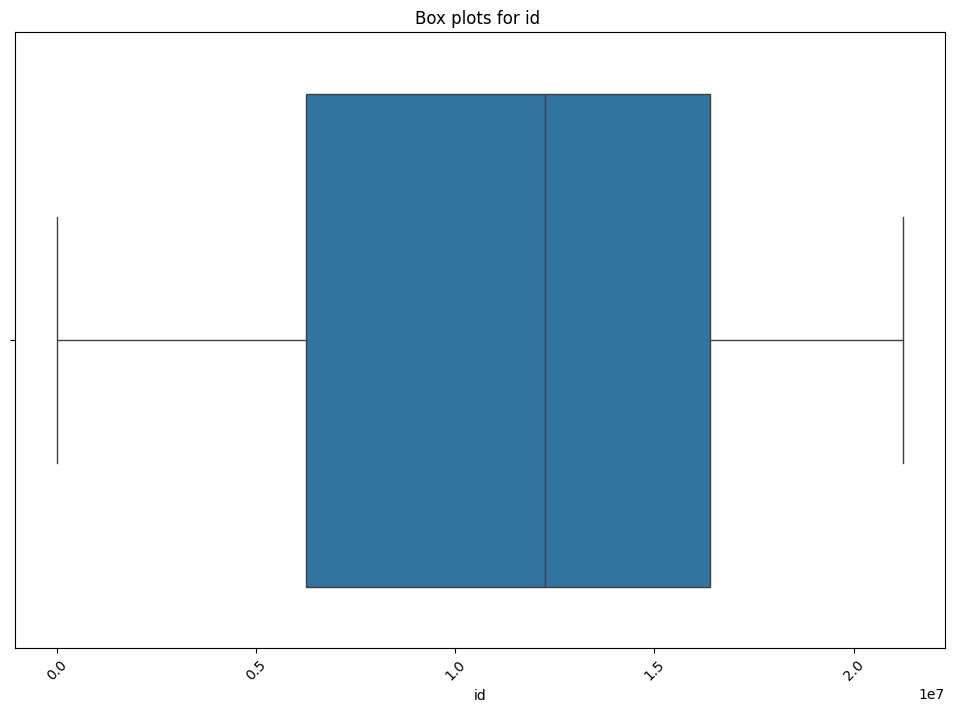

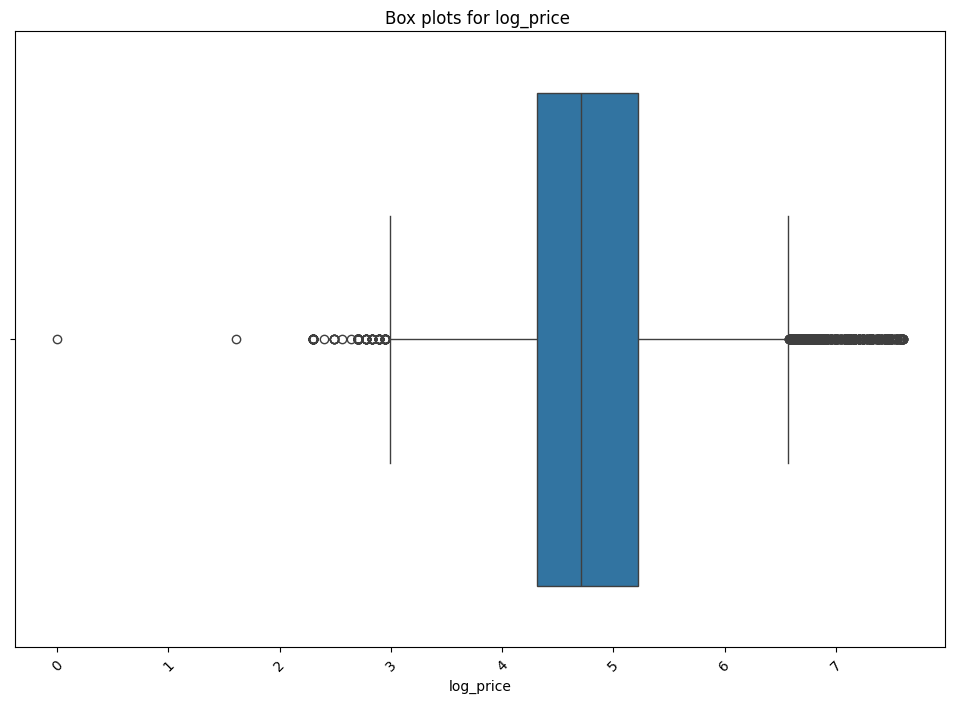

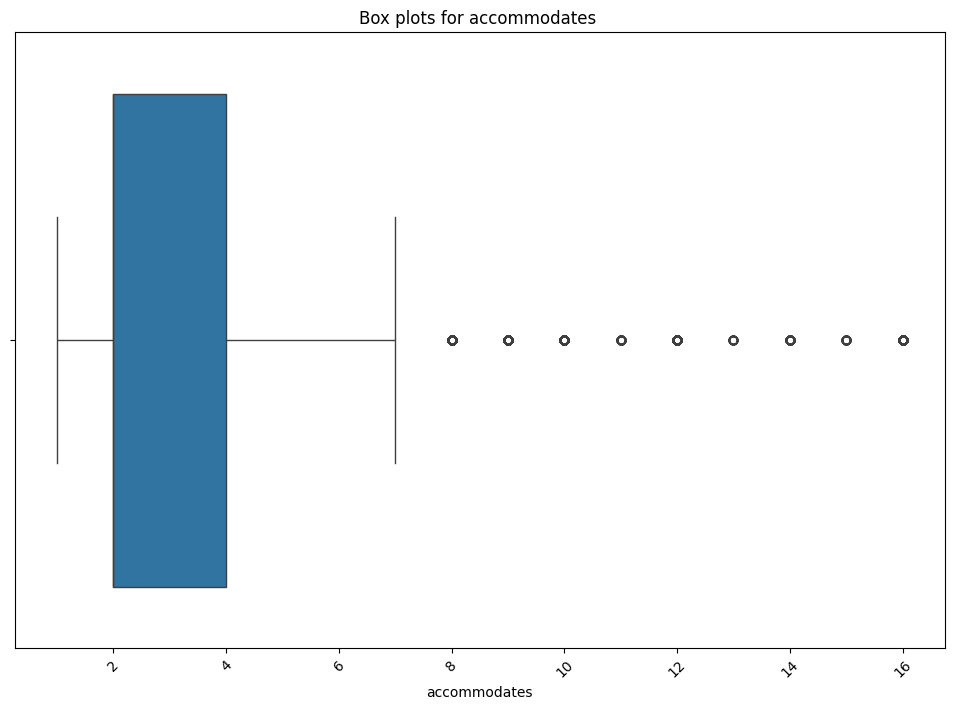

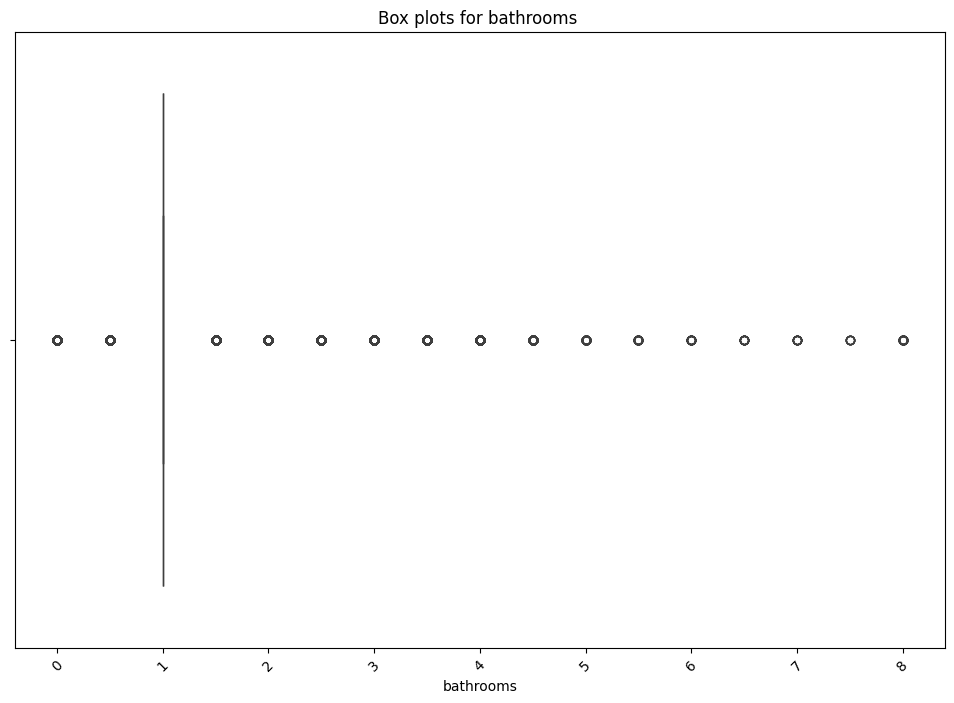

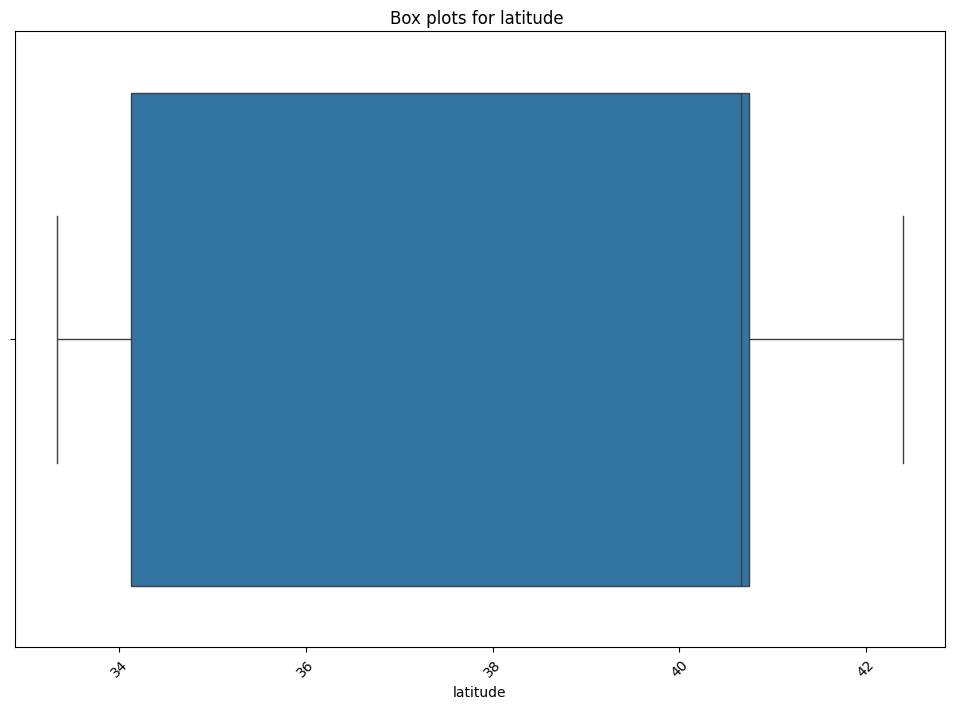

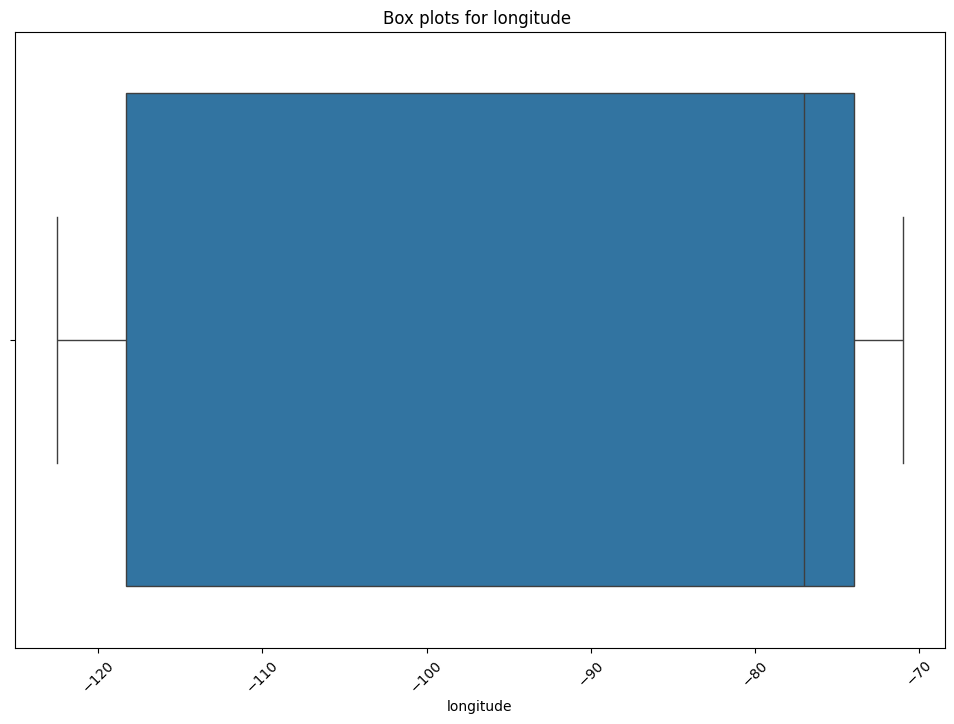

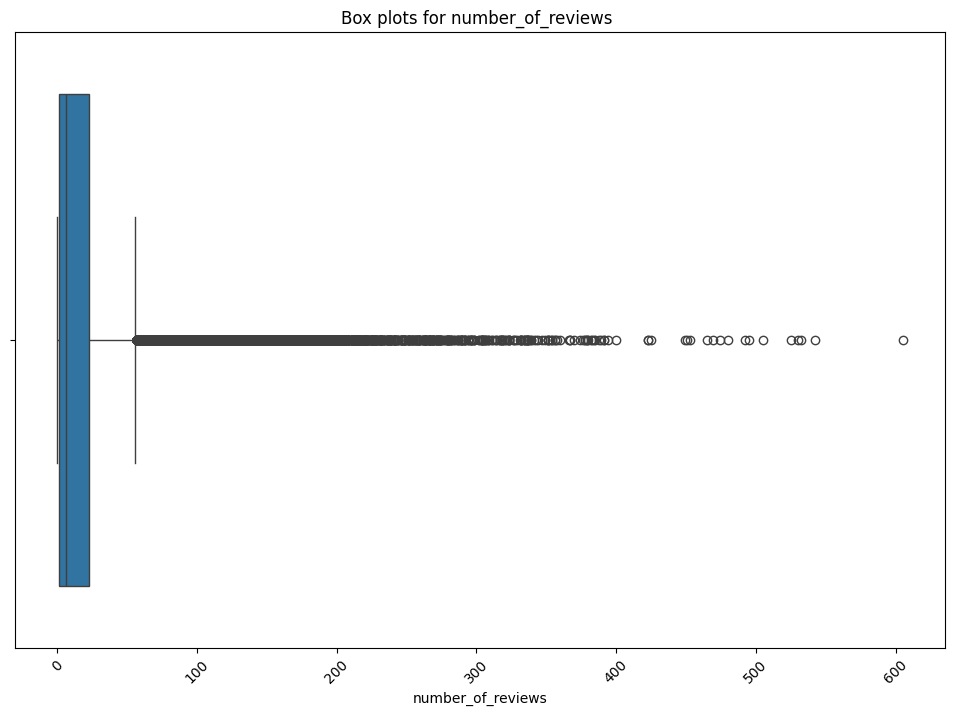

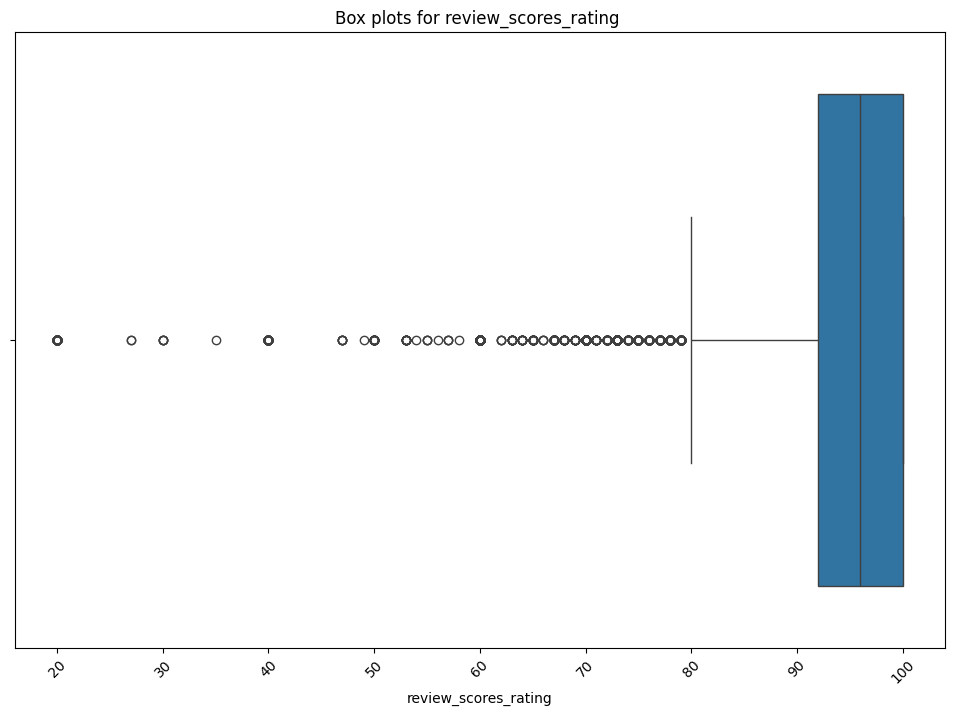

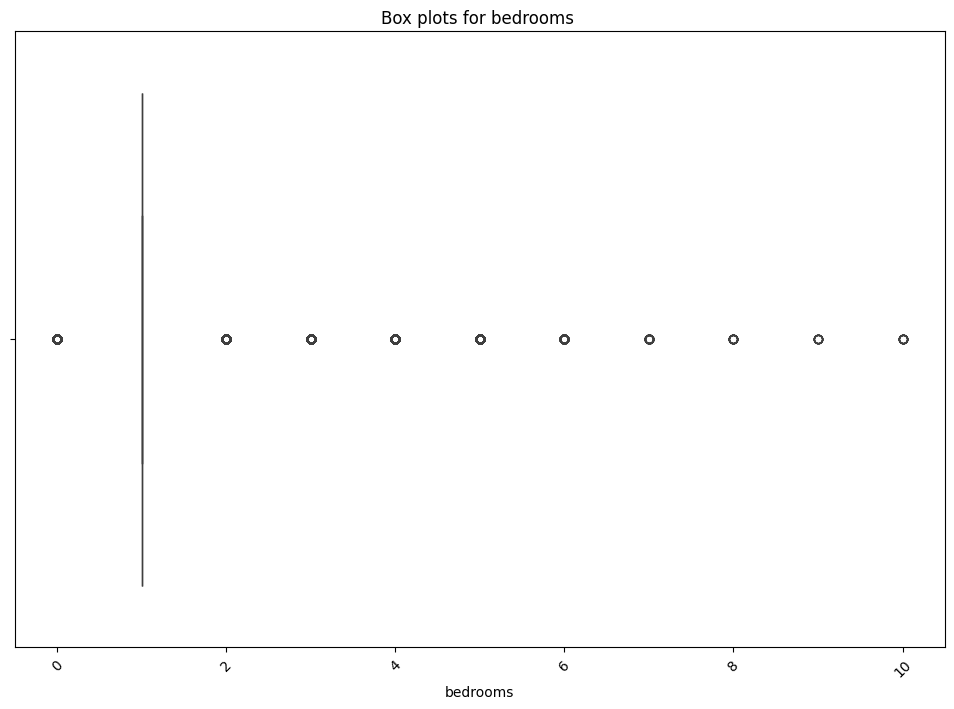

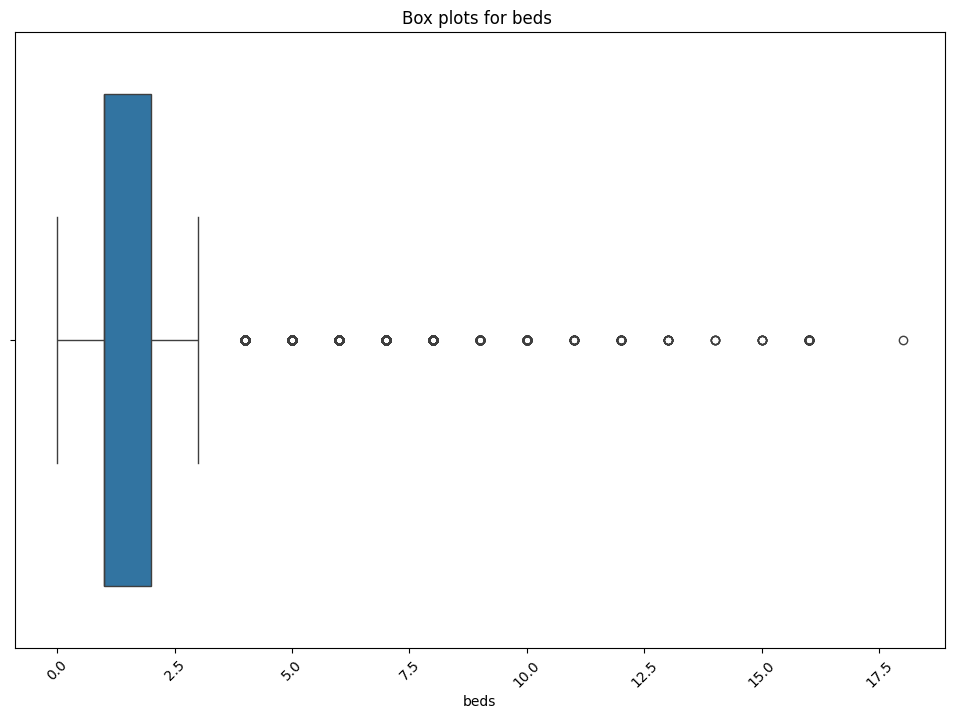

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for column in numerical_columns_data.columns:
  plt.figure(figsize=(12, 8))
  sns.boxplot(x=column, data=numerical_columns_data)
  plt.title(f'Box plots for {column} ')
  plt.xticks(rotation=45)
  plt.show()

It seems there are significant outliers. We will work on it later.

#**Task 1:** Feature Engineering



In [ ]:
from datetime import datetime

def calculate_host_tenure(host_since):
    if isinstance(host_since, float):
        return None
    host_since_date = datetime.strptime(host_since, "%m/%d/%Y")
    current_date = datetime.now()
    host_tenure = (current_date - host_since_date).days
    return host_tenure

def generate_amenities_count(amenities):
    return len(amenities)


def calculate_days_since_last_review(last_review):
    if isinstance(last_review, float):
        return None
    if last_review:
        last_review_date = datetime.strptime(last_review, "%m/%d/%Y")
        current_date = datetime.now()
        days_since_last_review = (current_date - last_review_date).days
        return days_since_last_review
    else:
        return None



In [ ]:
# Adding the new columns in my main dataframe
data['Host_Tenure'] = data['host_since'].apply(calculate_host_tenure)
data['Amenities_Count'] = data['amenities'].apply(generate_amenities_count)
data['Days_Since_Last_Review'] = data['last_review'].apply(calculate_days_since_last_review)

In [ ]:
data[["Host_Tenure","Amenities_Count","Days_Since_Last_Review" ]]

,Host_Tenure,Amenities_Count,Days_Since_Last_Review
0,4425.0,152,2850.0
1,2514.0,218,2418.0
2,2751.0,311,2427.0
3,3306.0,210,NaN
4,3355.0,174,2662.0
...,...,...,...
74106,4062.0,2,NaN
74107,2926.0,224,2579.0
74108,4506.0,402,2431.0
74109,2424.0,189,NaN


#**Task 2:** Exploratory Data Analysis (EDA)

### ***EDA on Numerical Columns***

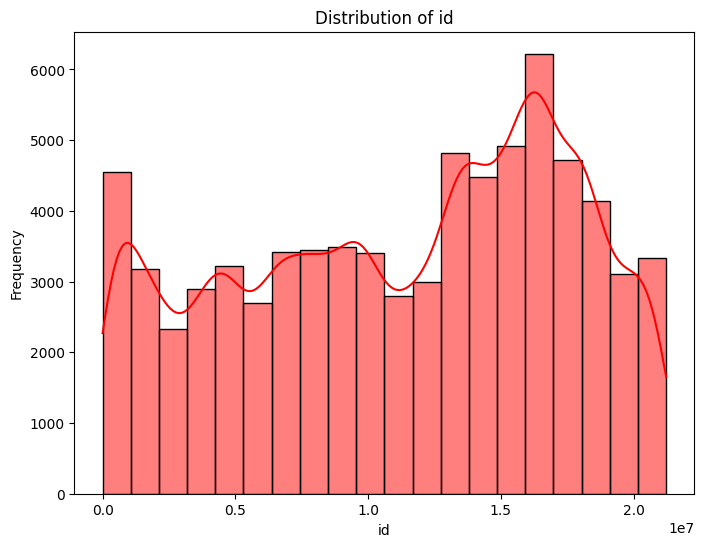

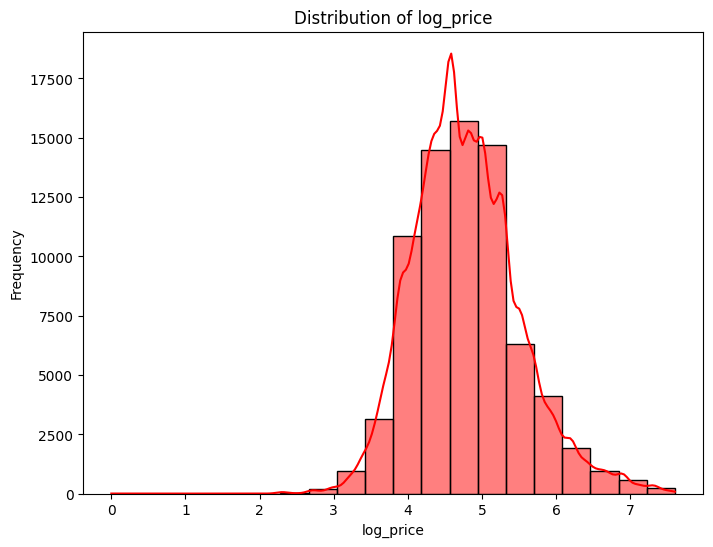

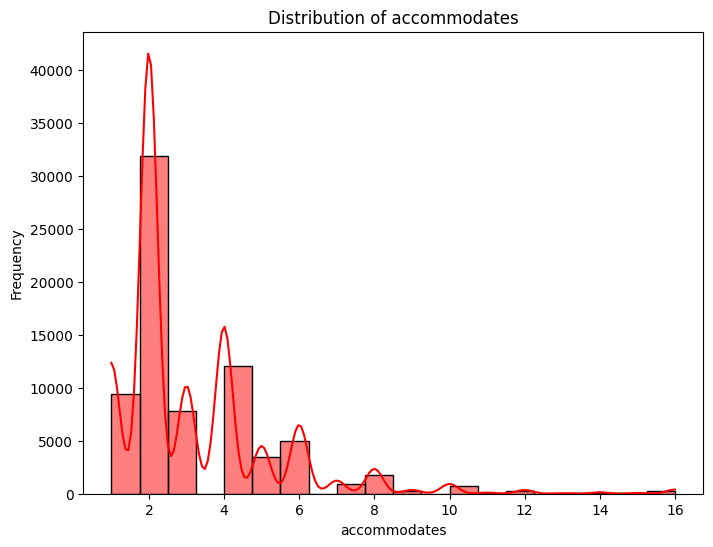

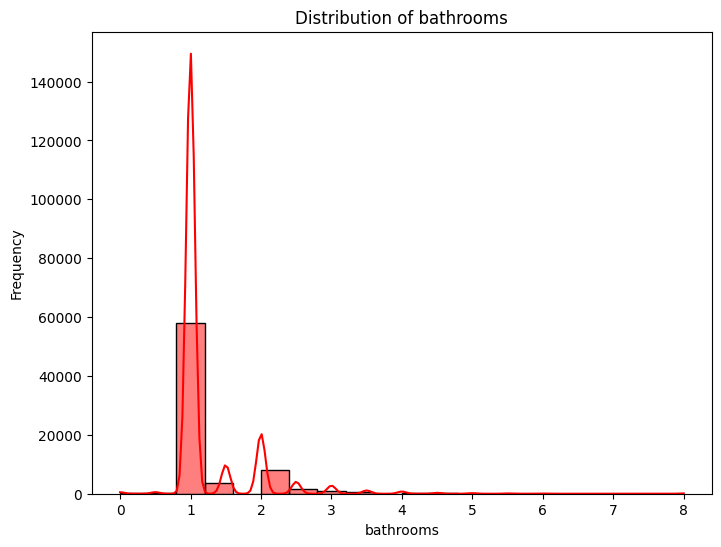

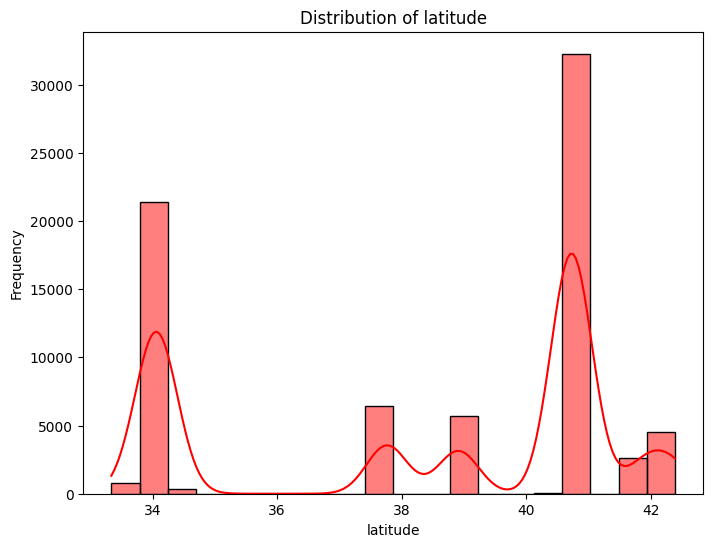

...

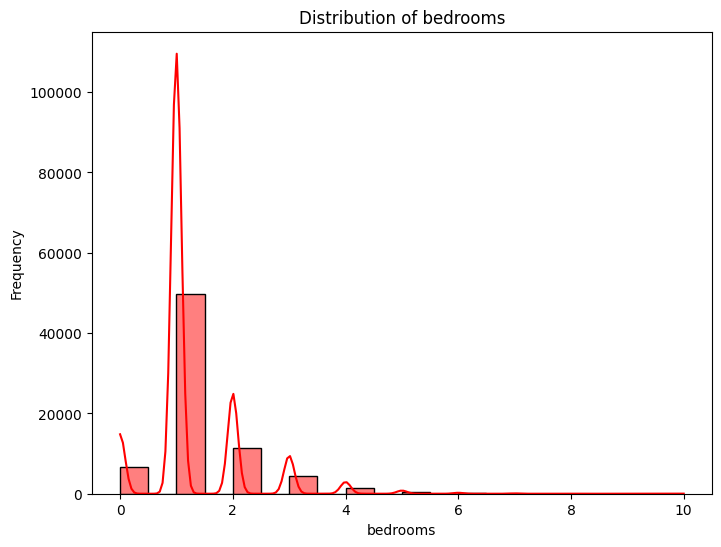

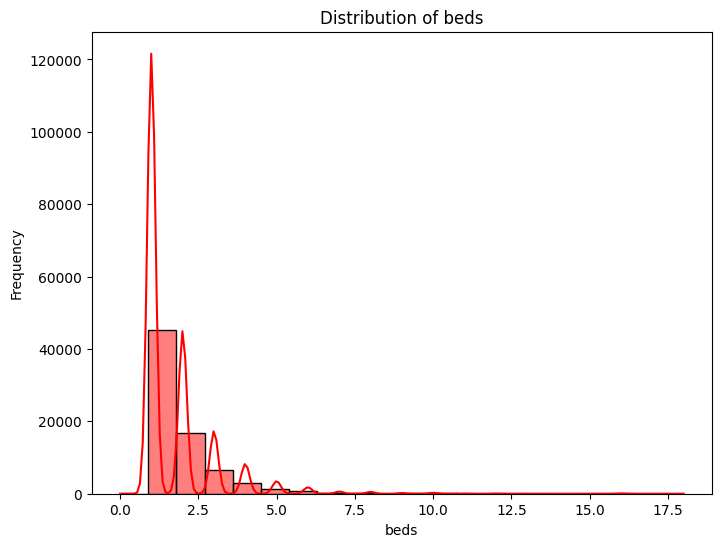

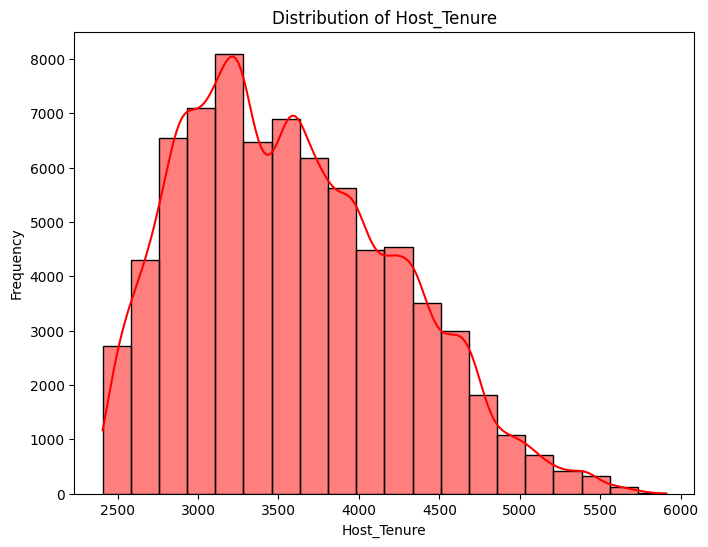

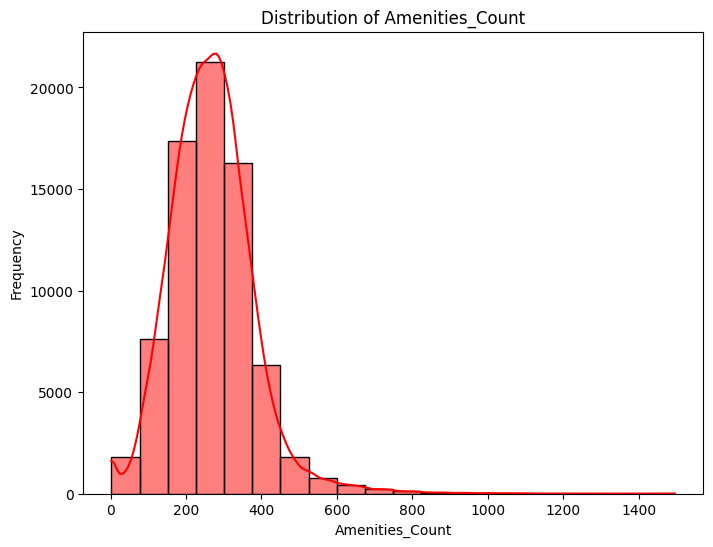

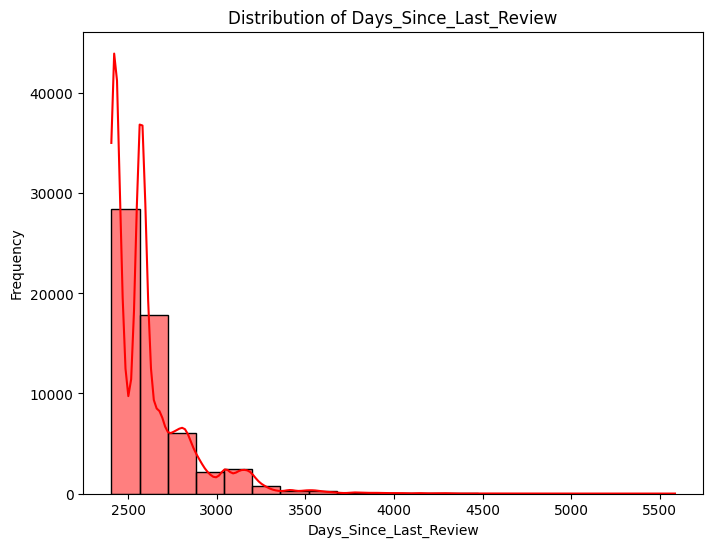

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_columns_data = data.select_dtypes(include=['int64', 'float64'])

for feature in numerical_columns_data.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[feature], kde=True, bins=20, color='red')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

**Observations:**

*   log_price is maximum around 4.6 and lie in the interval [4,5]
*   accomodates peak at 2 and the distribution seems heavily right skewed
*   mostly 1 bathroom per listing, again distribution is heavily right skewed
*   most of the listings are around 34. and 41. latitude
*   most of the listings are around -120. and 75. longitude
*   around 60000 listings have no reviews
*   amongst the listings which have review_scores_ratings, they are near 90-100% and heavily left skewed distribution
*   bedrooms and beds both peak around 1
*   the highest frequency occurring around the 3000-3500 range of Host_Tenure.
*   the most common number of amenities a listing has is between 200 and 400 amenities
*   majority of listings have Days_Since_Last_Review peak at 2500




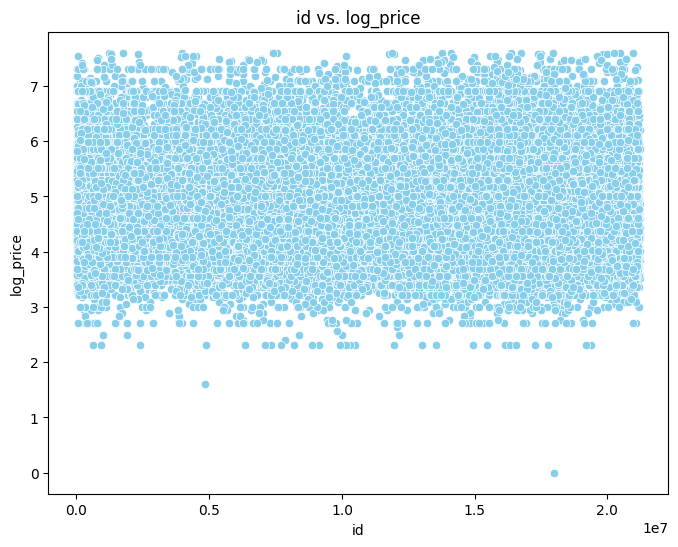

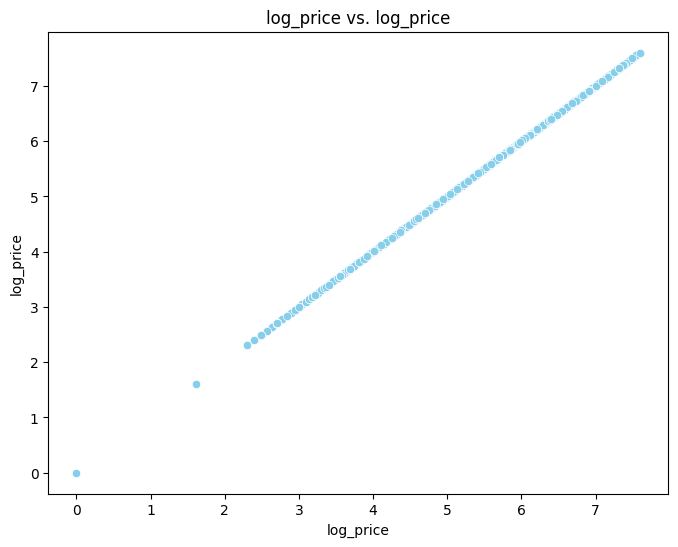

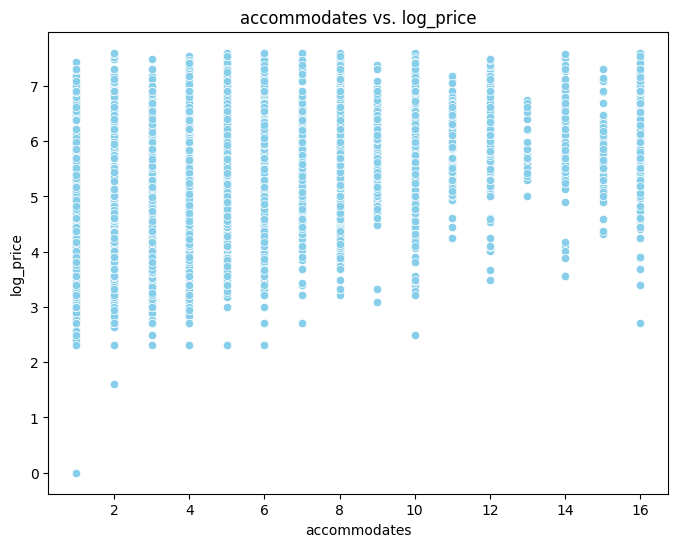

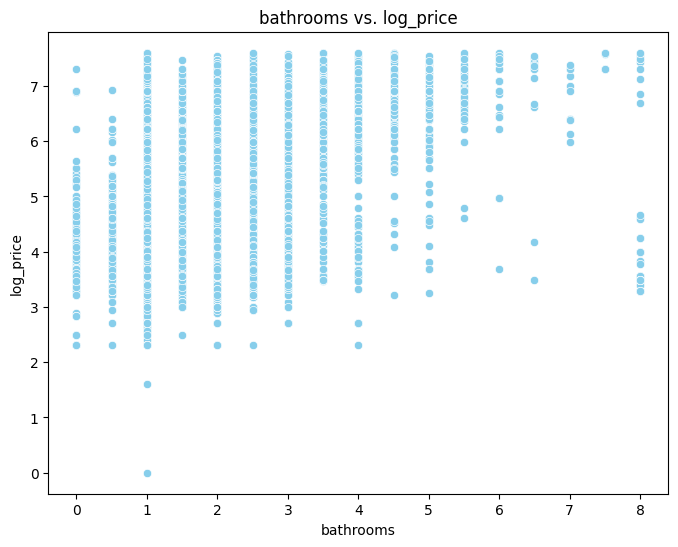

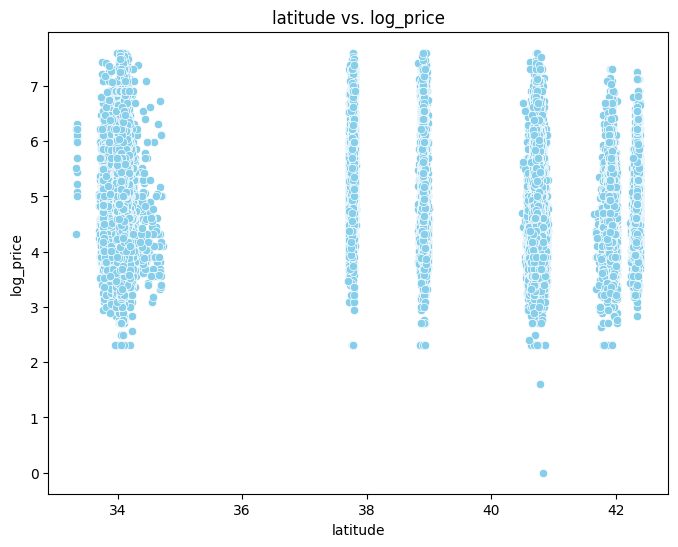

...

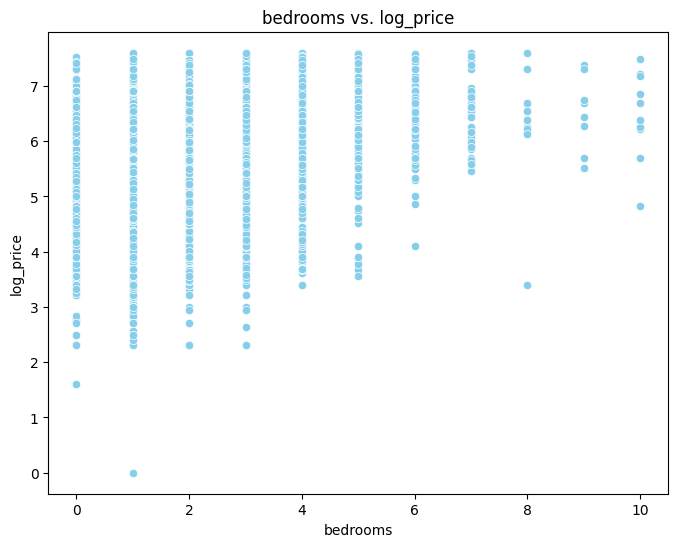

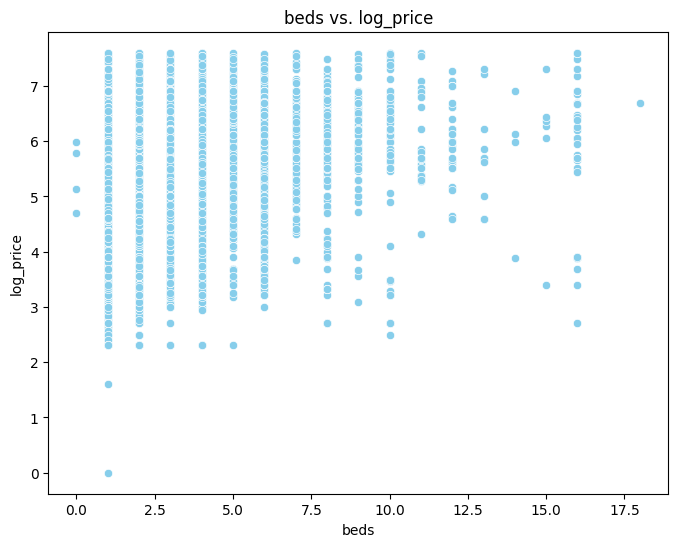

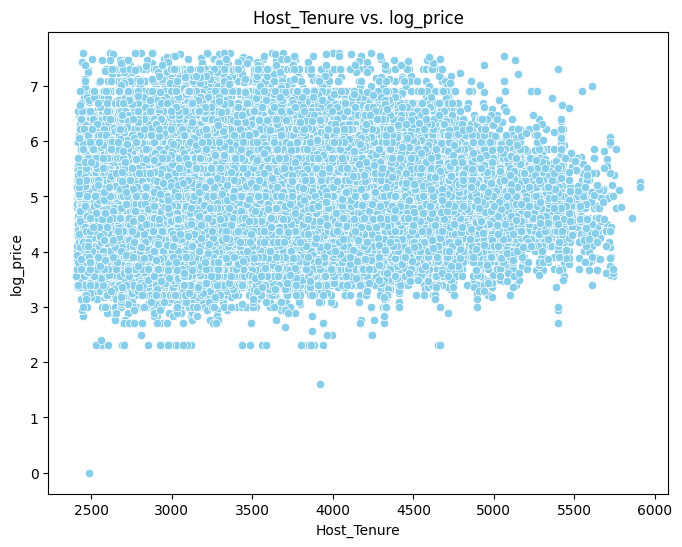

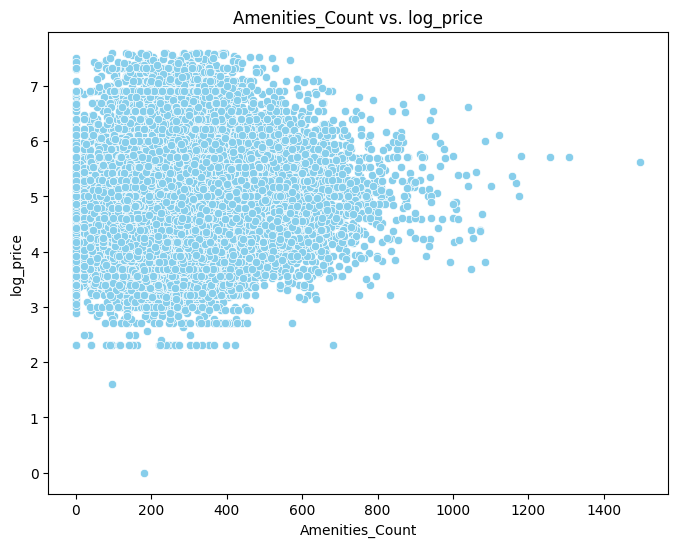

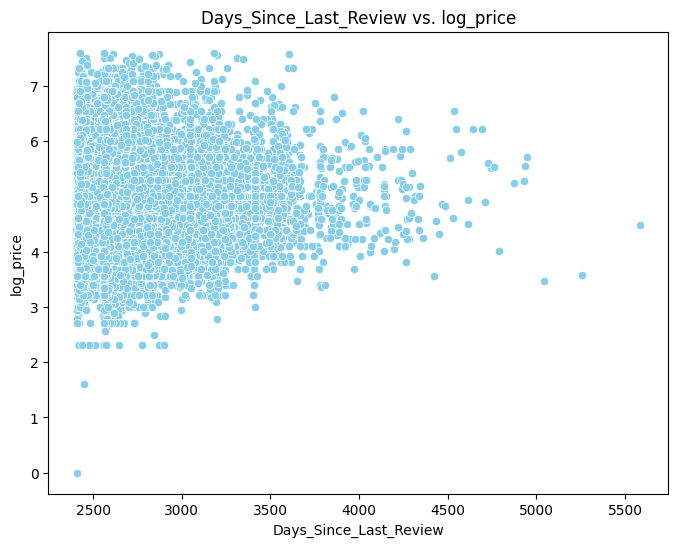

In [ ]:
# Scatter plots for numerical features vs. log_price
for feature in numerical_columns_data.columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='log_price', data=data, color='skyblue')
    plt.title(f'{feature} vs. log_price')
    plt.xlabel(feature)
    plt.ylabel('log_price')
    plt.show()

**Observations:**

*   log_price and accomodates are showing positive correlation
*   we cant see any significant correlation between bathrooms and log_price
*   mostly 1 bathroom per listing, again distribution is heavily right skewed
*   weak positive correlation between number_of_reviews and log_price
*   beds vs log_price have slight positive correlation
*   can observe positive correlation between Amenities_Count and log_price
*   no clear linear relationship between the number of days since a listing's last review and the log price.



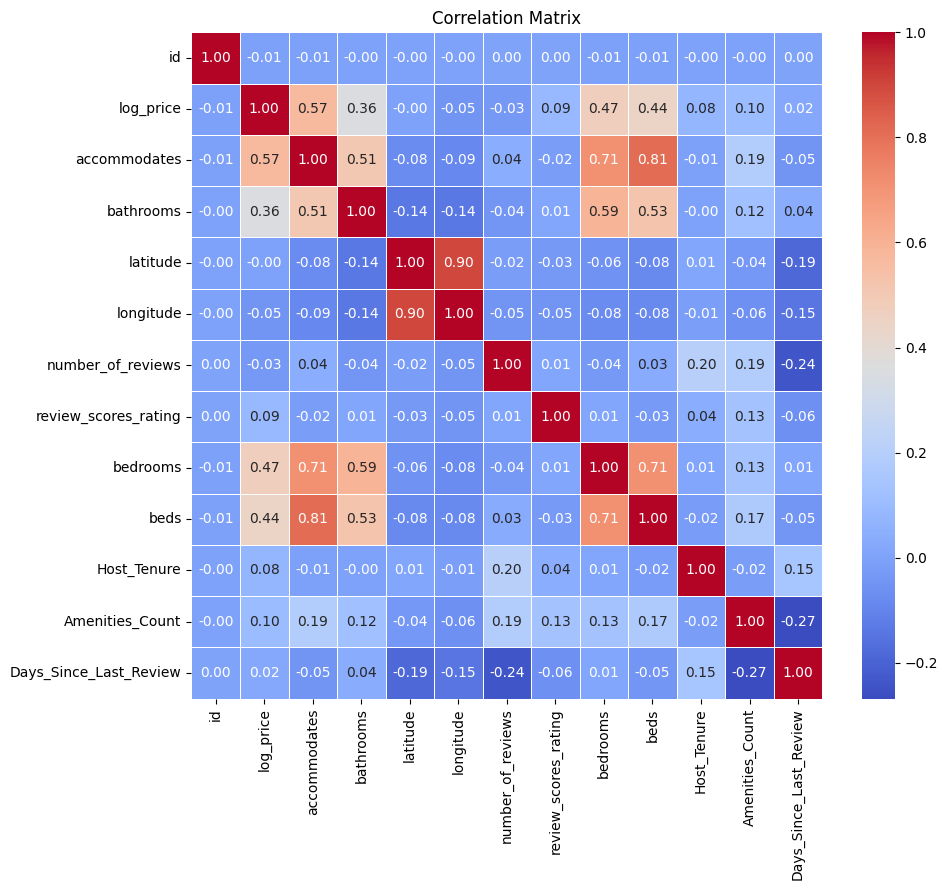

In [ ]:
correlation_matrix = numerical_columns_data.corr()
plt.figure(figsize=(10, 9))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

**Observations:**

Positive Correlations:

* Number of Reviews: Listings with more reviews tend to have higher log prices. This could be due to several factors, like increased trust from potential renters or properties with more features attracting more reviews.
* Number of Bedrooms & Beds: Listings with more bedrooms and beds are likely offered at higher log prices to accommodate larger groups.
* Amenities Count: Listings with a wider variety of amenities might have luxary and more services, reflected in the higher log price correlation.
* Number of Accommodates: Listings with a higher capacity tend to have higher log prices as they can host more guests.
* Bathroom Count: Similar to bedrooms, listings with more bathrooms are likely priced higher to cater to larger groups or offer a more luxurious experience.

No Significant Correlation:
* Days Since Last Review: The correlation between the recency of reviews and log price might be weak or absent.



### ***EDA on Categorical Columns***

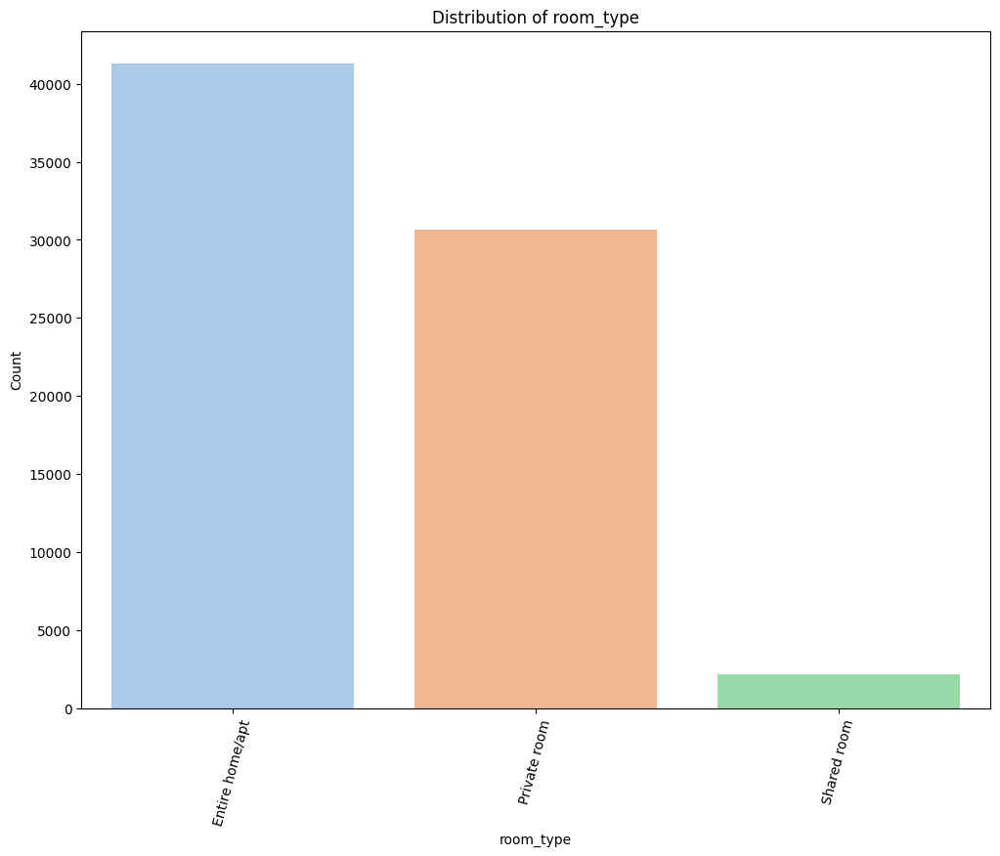

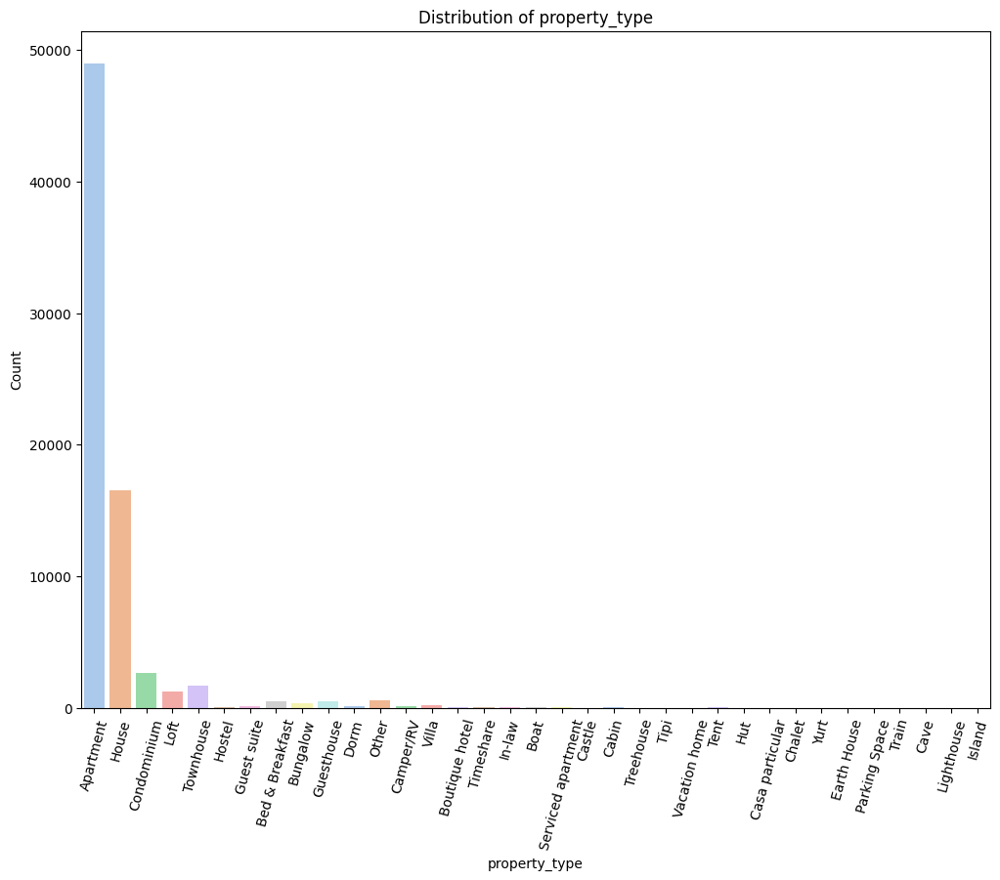

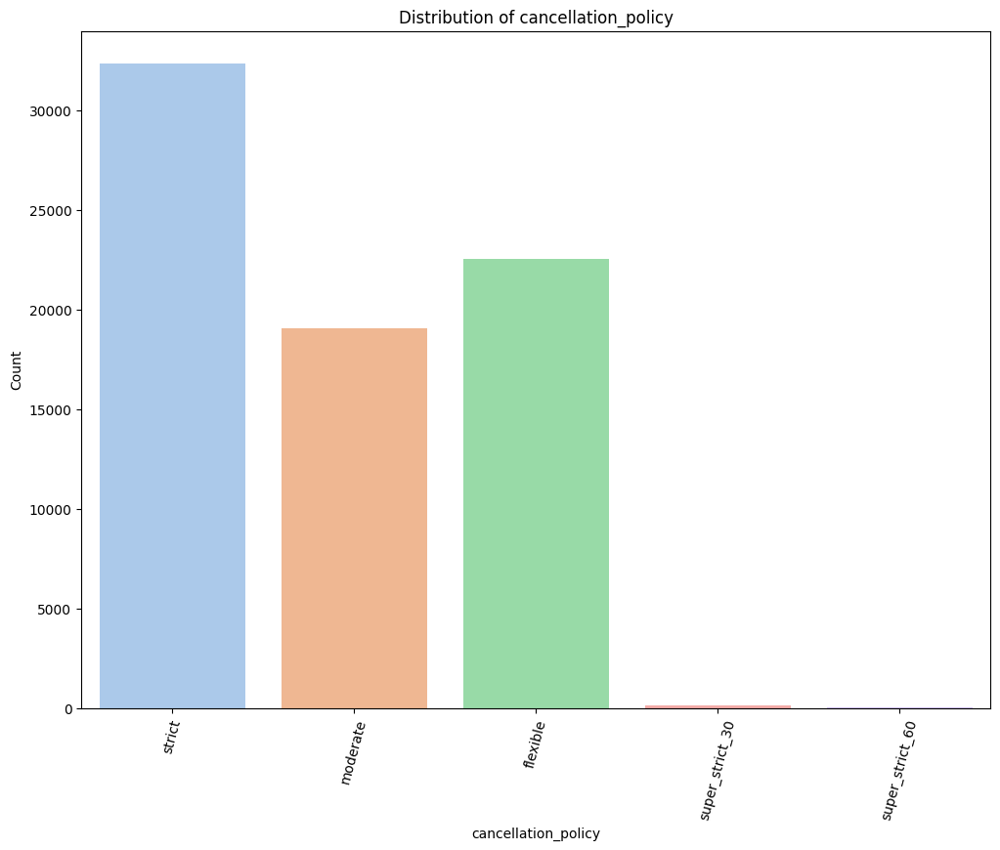

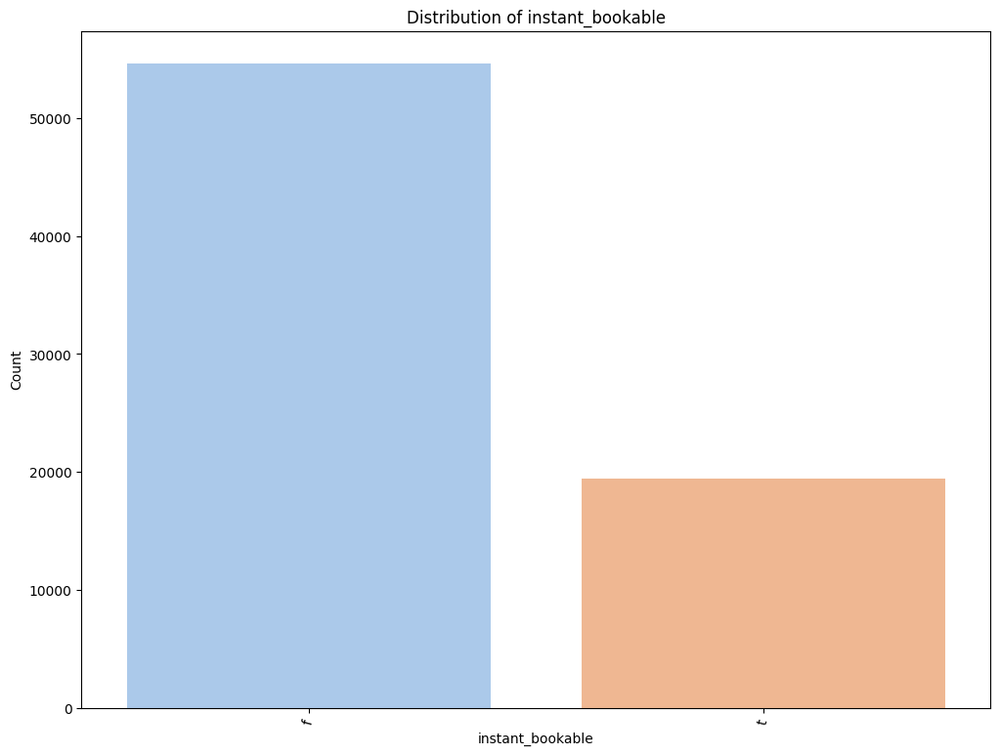

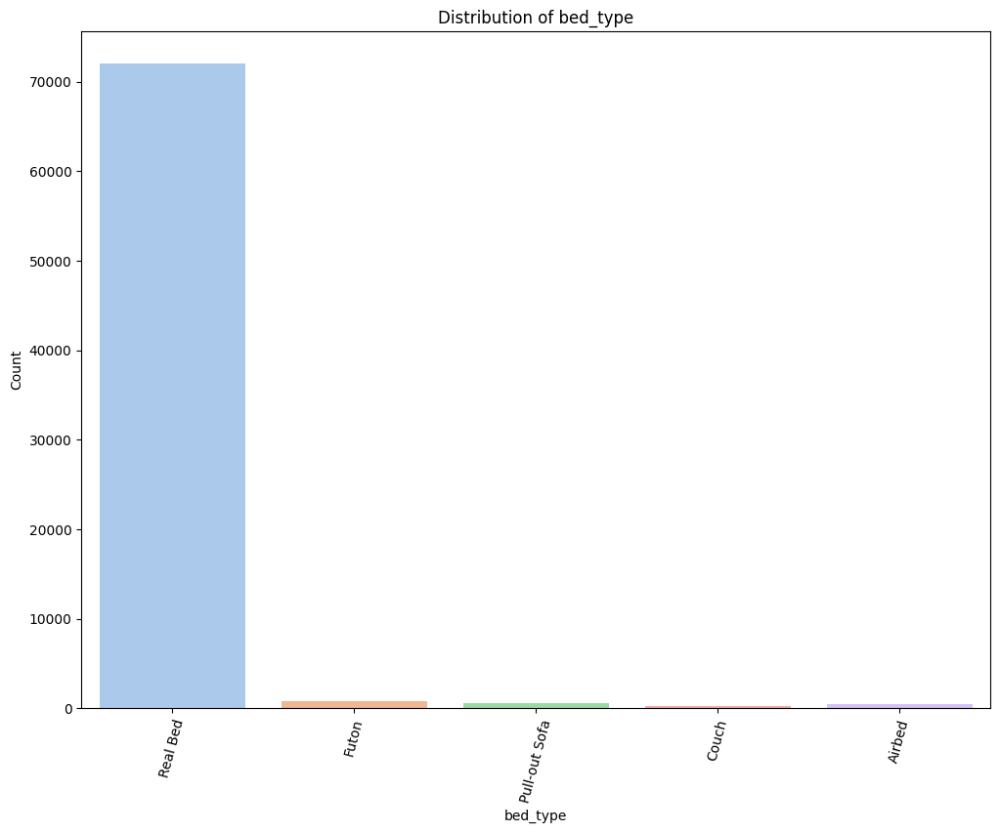

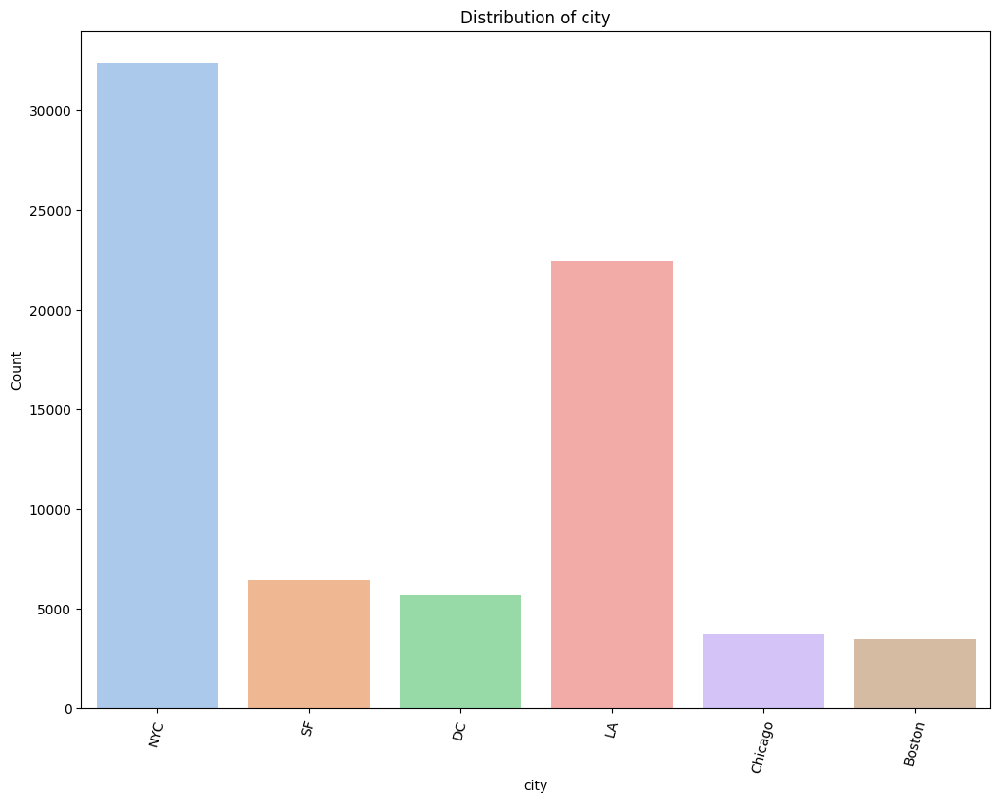

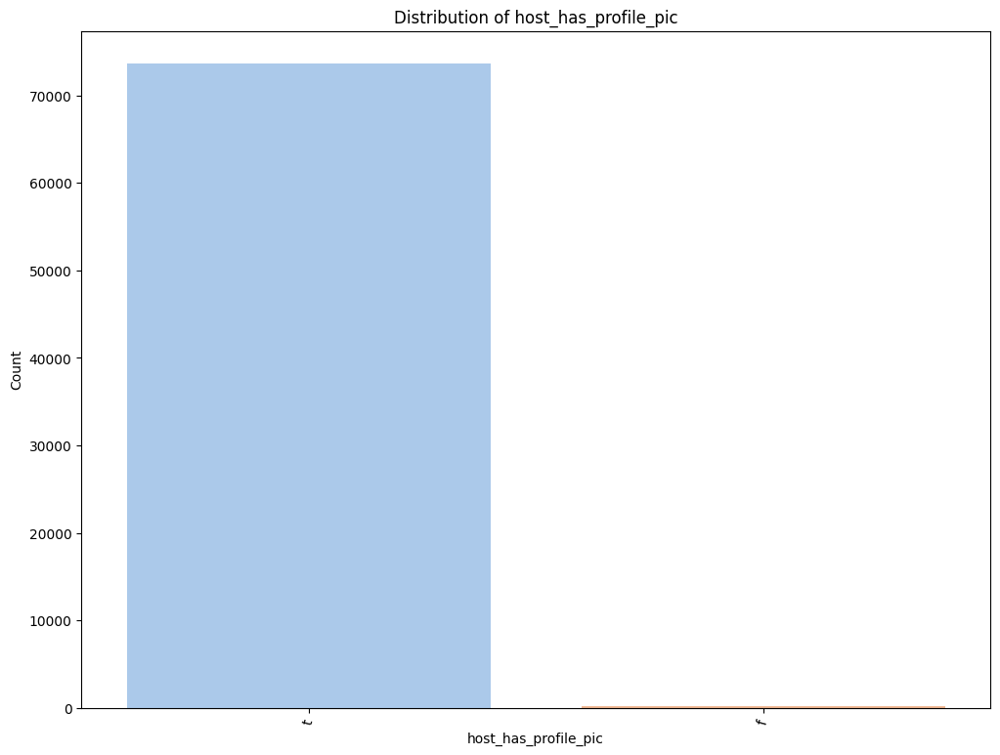

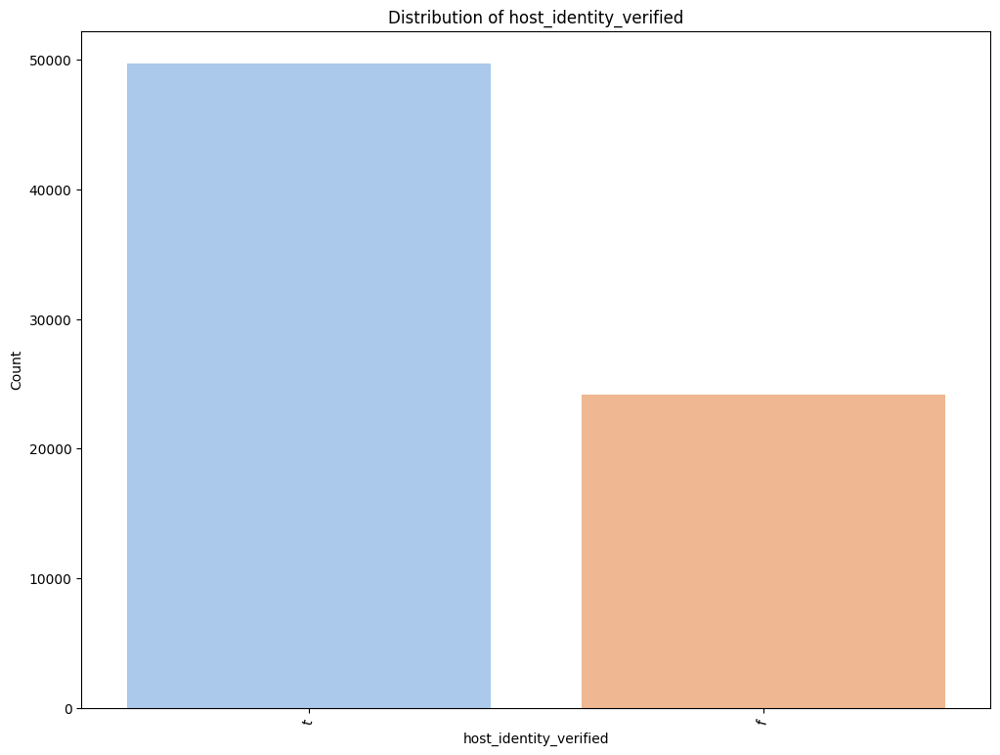

In [ ]:
cat_columns_to_plot = ['room_type', 'property_type', 'cancellation_policy',
                       'instant_bookable', 'bed_type', 'city',
                       'host_has_profile_pic', 'host_identity_verified']
for feature in cat_columns_to_plot:
    plt.figure(figsize=(12, 9))
    sns.countplot(x=feature, data=data, hue=feature, palette='pastel', legend=False)
    plt.title(f'Distribution of {feature}')
    plt.xticks(rotation=75)
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.show()


**Observations:**

*   lease common room type is shared room
*   most of the property_type seems to be Apartments
*   most of the cancellation_policy are strict but super_strict are rare.
*   maximum listings can be booked instantly
*   around 90 percent of listings have Real Bed as bed_type
*   around 35K listings are situation in NYC followed by LA and then evenly distributed amongst remaining cities
*   95% + host_has_profile_pic
*   1/3rd hosts dont have their identity verified





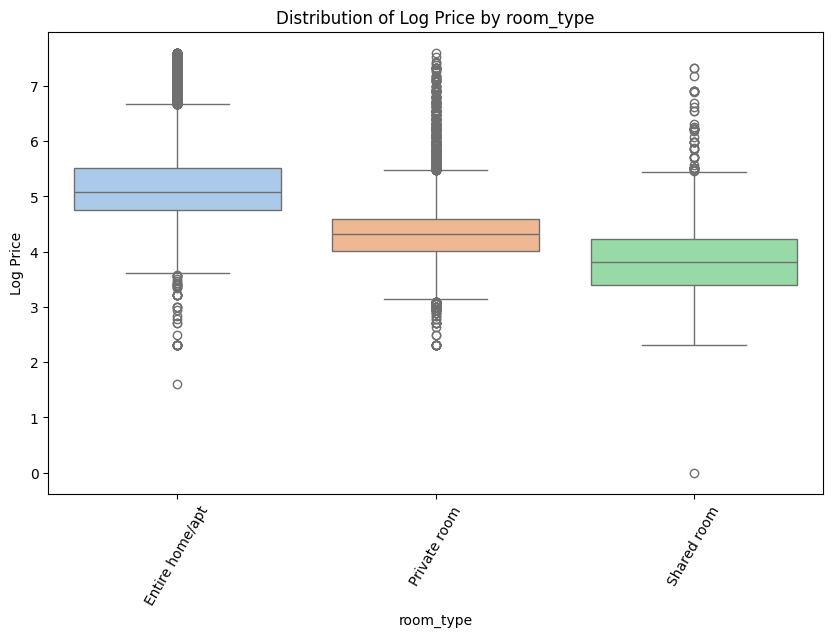

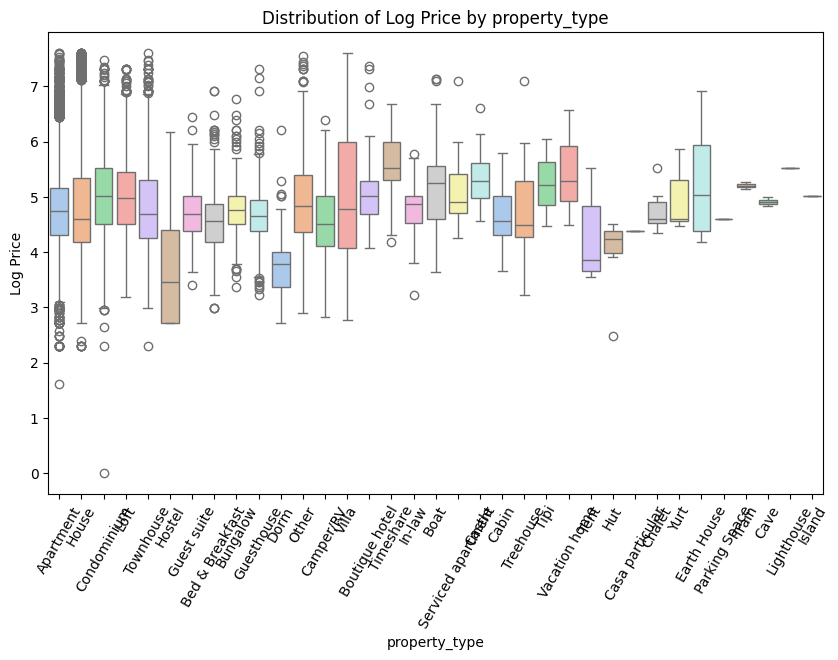

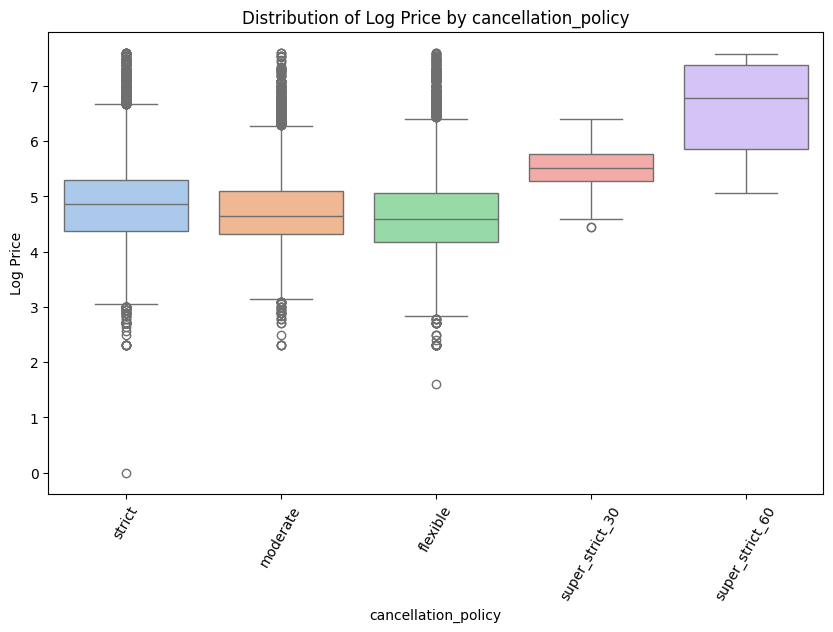

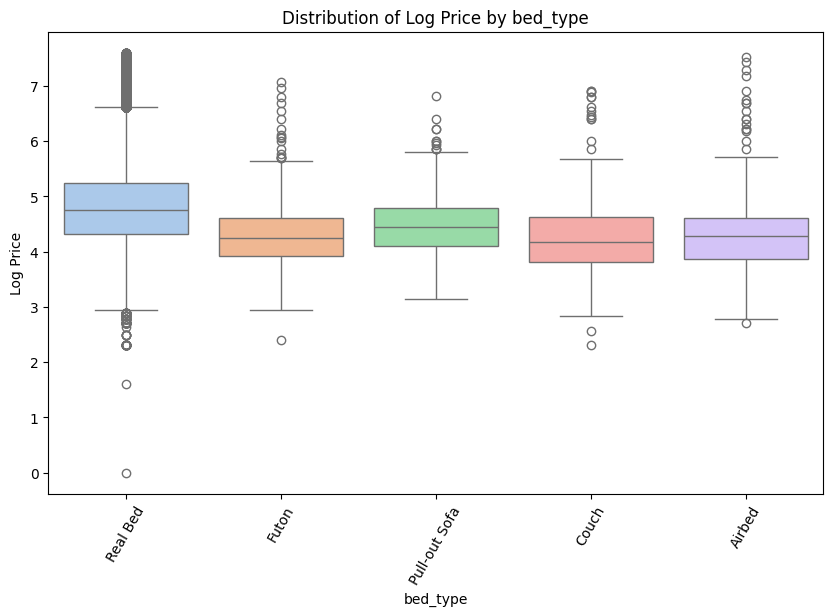

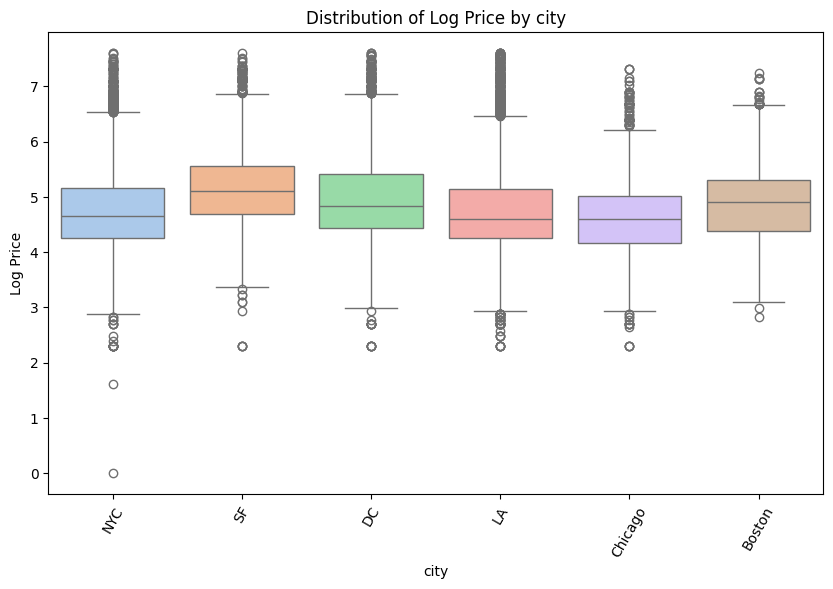

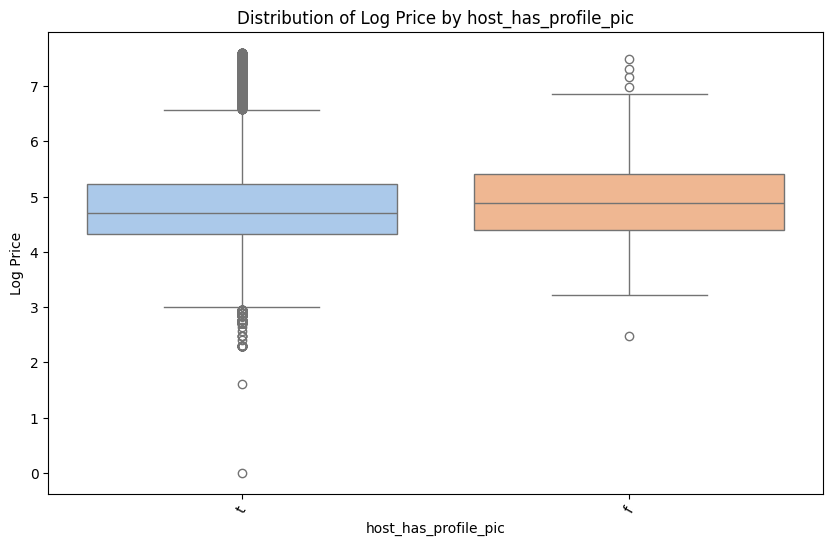

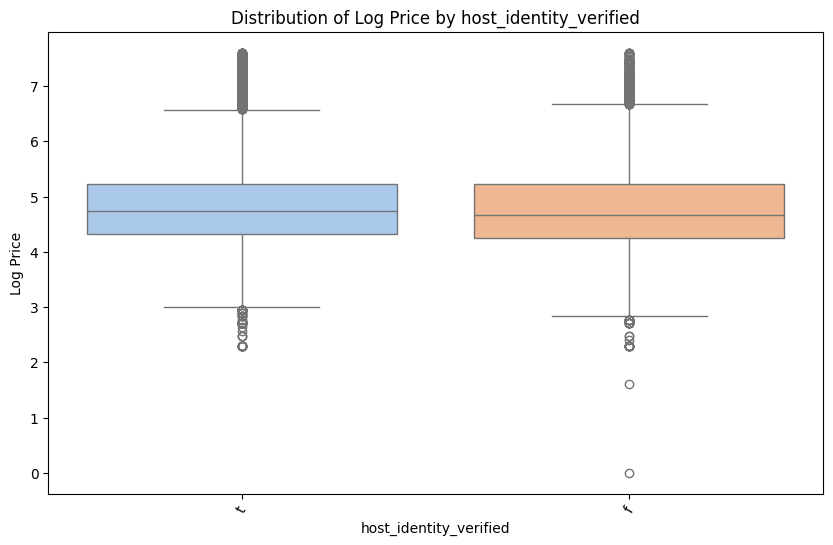

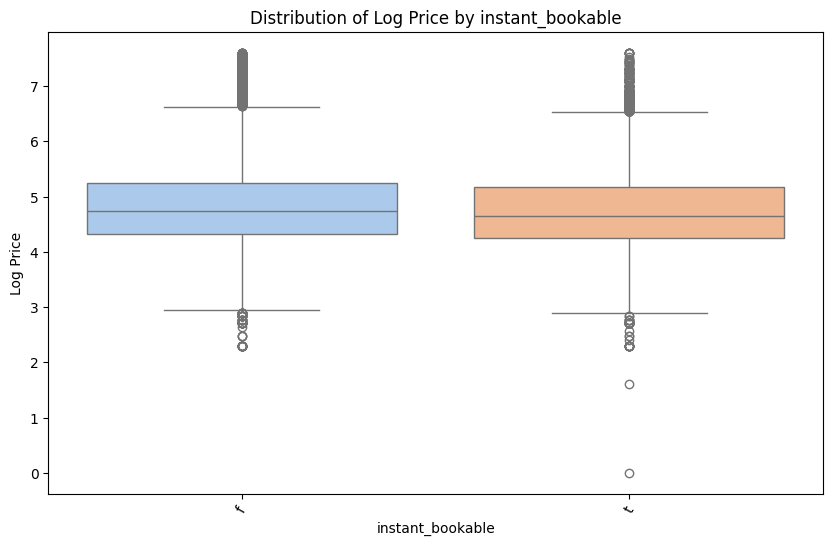

In [ ]:
# Plotting categorical columns vs log price
cat_columns = ['room_type', 'property_type', 'cancellation_policy',
               'bed_type', 'city', 'host_has_profile_pic',
               'host_identity_verified', 'instant_bookable']

for column in cat_columns:

    # Visualization: Box plot of log_price vs. categorical variable
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=column, y='log_price', data=data, hue=column, palette='pastel', legend=False)
    plt.title(f'Distribution of Log Price by {column}')
    plt.xlabel(column)
    plt.ylabel('Log Price')
    plt.xticks(rotation=60)
    plt.show()


**Observations:**

*   room_type with highest median log price is entire home/apt followed by privvate_room and least for shared_room. A lot of variability can be seen in the distribution
*   Expensive (median log price): Serviced apartment, Boutique Hotel. Cheap (median log price): Hostel, Dorm, Campsite. Prices vary more for Apartment, House, Condominium, Townhouse, Guest suite, Bed and Breakfast, Bungalow, Guesthouse, In-law showing alot of variablility.
*   Strict cancellation = Higher price. Flexible cancellation = Lower price.
*   King beds most expensive, Single beds cheapest. There appears to be some overlap in the distribution of log prices between all bed types.
*   SF priciest
*   Hosts with profile pictures tend to list at higher prices.
*   What we can observe is that there is alot of variablility in the dataset. But the data points at the extremes of data are less which may affect our accuracy while modelling.




#**Task 3:** Geospatial Analysis

In [ ]:
import folium
from folium.plugins import MarkerCluster

# Create a base map using Folium
m = folium.Map(location=[data['latitude'].mean(), data['longitude'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# Adding markers for each listing
for idx, row in data.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=f"Log Price: {row['log_price']}").add_to(marker_cluster)

# Save the map as an HTML file for interactive viewing
m.save('listings_map.html')
m

**The link to the saved map**: https://drive.google.com/file/d/1n3sdzNowSDC0gyF1L0RLeylKDs6nVJdm/view?usp=sharing

###*Examining if certain neighbourhoods or proximity to city centres influence pricing*

In [ ]:
import plotly.express as px

# We are grouping the data now by neibourhood in order to examine its influence
average_prices = data.groupby('neighbourhood')['log_price'].mean().reset_index()

fig = px.bar(average_prices, x='neighbourhood', y='log_price', title='Average Prices by Neighbourhood',
             labels={'neighbourhood': 'Neighbourhood', 'log_price': 'Average Log Price'})
fig.update_layout(xaxis_tickangle=-45)
fig.show()


**Observations:**

*   Neighbhourhood = Wilmington have highest average Log Price of around 7.17, followed by Chevy Chase of 7.13 and then Observatory Circle of around 6.71
*   Neighbourhood = West Elsdon have lowest average log price of 3.40 then Enflewood with slightly better arounf 3.66 and then Edison park West with 3.66




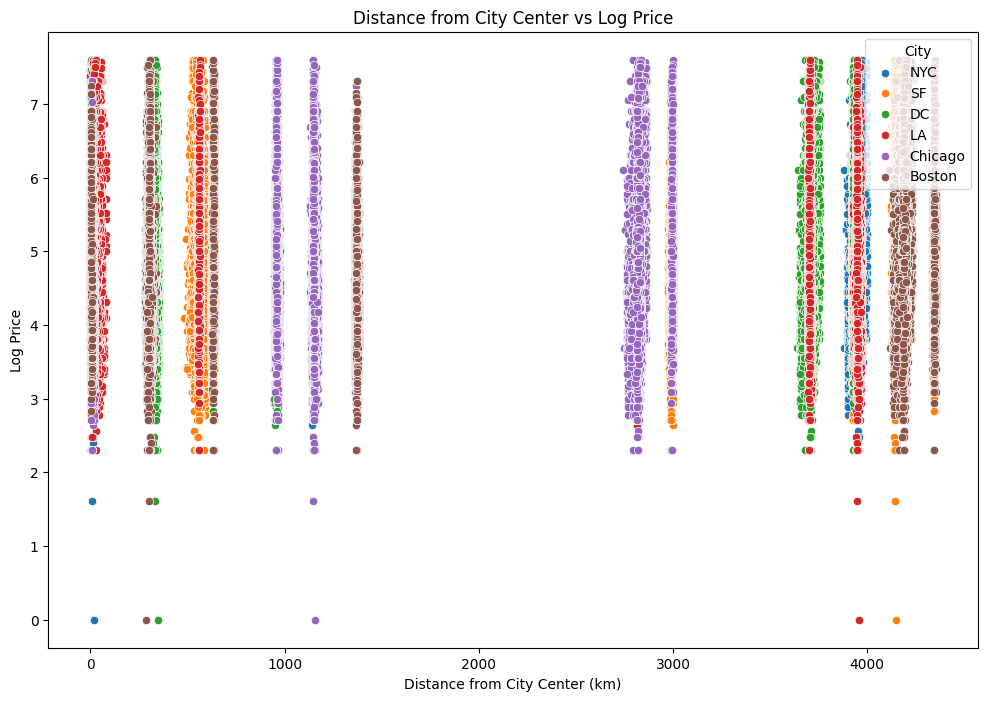

In [ ]:
from geopy.distance import geodesic

# data taken from the web
city_centers = {
    'NYC': (40.7128, -74.0060),
    'SF': (37.7749, -122.4194),
    'DC': (38.9072, -77.0369),
    'LA': (34.0522, -118.2437),
    'Chicago': (41.8781, -87.6298),
    'Boston': (42.3601, -71.0589)
}

# Calculating distance from city center for each listing
for city, center in city_centers.items():
    data[f'distance_from_{city}'] = data.apply(lambda row: geodesic(center, (row['latitude'], row['longitude'])).kilometers, axis=1)

# Analysing the relation how distance from city center affects the log_price
plt.figure(figsize=(12, 8))
for city in city_centers.keys():
    sns.scatterplot(x=f'distance_from_{city}', y='log_price', data=data, label=city)

plt.title('Distance from City Center vs Log Price')
plt.xlabel('Distance from City Center (km)')
plt.ylabel('Log Price')
plt.legend(title='City', loc='upper right')
plt.show()


In [ ]:
def calculate_distance_from_city_center(row, city_center):
    return geodesic(city_center, (row['latitude'], row['longitude'])).kilometers

for city, center in city_centers.items():
    data[f'distance_from_{city}'] = data.apply(calculate_distance_from_city_center, axis=1, args=(center,))

# Creating dynamic scatter plot for better readability
def plot_dynamic_scatter_plot(city_centers, data):
    fig = px.scatter(data_frame=data, x=[f'distance_from_{city}' for city in city_centers.keys()], y='log_price',
                     labels={'x': 'Distance from City Center (km)', 'y': 'Log Price'},
                     title='Distance from City Center vs Log Price')
    fig.update_traces(marker=dict(size=10))
    fig.update_layout(legend_title='City', legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1))
    fig.show()

plot_dynamic_scatter_plot(city_centers, data)


#**Task 4:** Sentiment Analysis on Textual Data

####Using NLTK


In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
from nltk.sentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

def get_sentiment_label(text):
    sentiment_scores = sia.polarity_scores(text)
    compound_score = sentiment_scores['compound']
    if compound_score >= 0.05:
        return 'positive'
    elif compound_score <= -0.05:
        return 'negative'
    else:
        return 'neutral'

data['sentiment_label'] = data['description'].apply(get_sentiment_label)


In [ ]:
data['sentiment_label']

0        positive
1        positive
2        positive
3        positive
4        positive
           ...   
74106     neutral
74107    positive
74108    positive
74109    positive
74110    positive
Name: sentiment_label, Length: 74111, dtype: object

In [ ]:
data['sentiment_label'].value_counts()

sentiment_label
positive    70234
neutral      2190
negative     1687
Name: count, dtype: int64

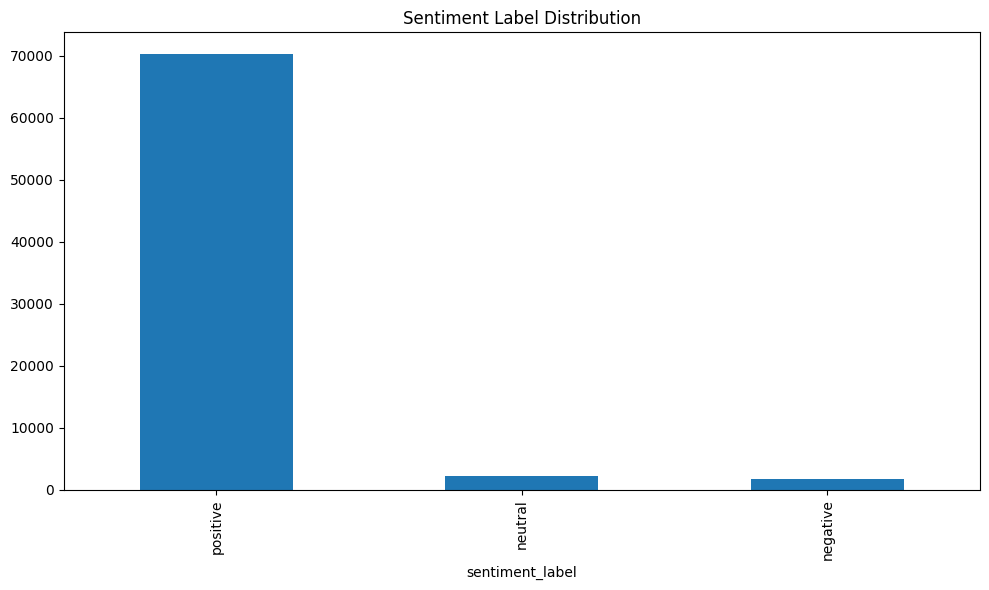

In [ ]:
plt.figure(figsize=(10, 6))
data['sentiment_label'].value_counts().plot(kind="bar")
plt.title('Sentiment Label Distribution')
plt.tight_layout()
plt.show()


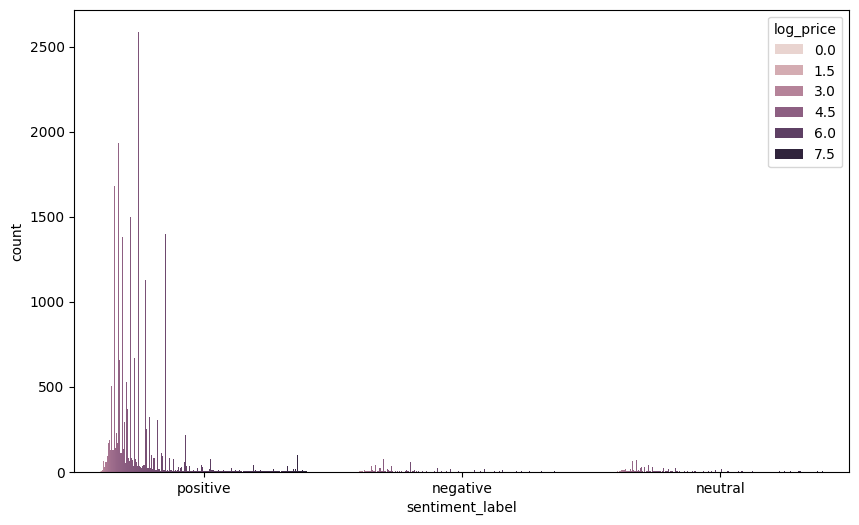

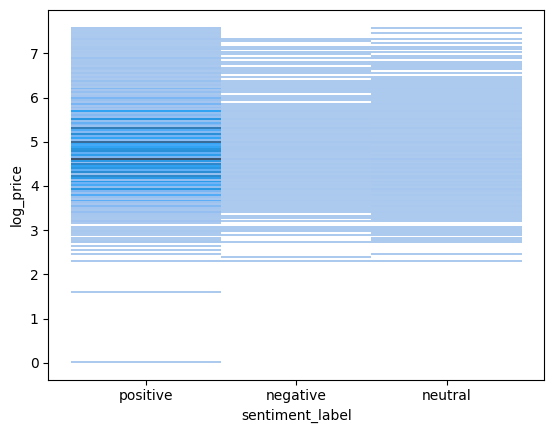

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x=data['sentiment_label'], hue=data["log_price"])
plt.show()
sns.histplot(x=data['sentiment_label'],y=data["log_price"])
plt.show()

#**Task 5:** Amenities Analysis:

In [ ]:
data.dtypes

id                          int64
log_price                 float64
property_type              object
room_type                  object
amenities                  object
accommodates                int64
bathrooms                 float64
bed_type                   object
cancellation_policy        object
cleaning_fee                 bool
city                       object
description                object
first_review               object
host_has_profile_pic       object
host_identity_verified     object
host_response_rate         object
host_since                 object
instant_bookable           object
last_review                object
latitude                  float64
longitude                 float64
name                       object
neighbourhood              object
number_of_reviews           int64
review_scores_rating      float64
thumbnail_url              object
zipcode                    object
bedrooms                  float64
beds                      float64
Host_Tenure   

In [ ]:
data[['amenities','Amenities_Count','log_price']].head()

,amenities,Amenities_Count,log_price
0,"{""Wireless Internet"",""Air conditioning"",Kitche...",152,5.010635
1,"{""Wireless Internet"",""Air conditioning"",Kitche...",218,5.129899
2,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",311,4.976734
3,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",210,6.620073
4,"{TV,Internet,""Wireless Internet"",""Air conditio...",174,4.744932


In [ ]:
import re
from sklearn.preprocessing import MultiLabelBinarizer

def extract_amenities(text):
    amenities = re.findall(r'"(.*?)"', text)
    return amenities


In [ ]:
data['amenities'] = data['amenities'].apply(extract_amenities)
mlb = MultiLabelBinarizer()
amenities_df = pd.DataFrame(mlb.fit_transform(data['amenities']), columns=mlb.classes_, index=data.index)

data_processed = pd.concat([amenities_df, data[['log_price']]], axis=1)
correlations = data_processed.corr()['log_price'].dropna()


In [ ]:
significant_amenities = correlations.sort_values(ascending=False)

print("Significant Amenities:")
print(significant_amenities)


Significant Amenities:
log_price                                     1.000000
Family/kid friendly                           0.290455
Cable TV                                      0.237680
Indoor fireplace                              0.170569
Hair dryer                                    0.117526
                                                ...   
Smoking allowed                              -0.067840
Pets live on this property                   -0.098428
Lock on bedroom door                         -0.134251
translation missing: en.hosting_amenity_50   -0.208891
translation missing: en.hosting_amenity_49   -0.232834
Name: log_price, Length: 100, dtype: float64


We can clearly see the most significant and least significant Amenities associated with higher or lower prices

In [ ]:
data.to_csv('/content/drive/MyDrive/model_data', index=False)

# **Data Preparation**


In [ ]:
import pandas as pd
modelling_data = pd.read_csv('/content/drive/MyDrive/model_data.csv')

In [ ]:
unique_value_counts = modelling_data['property_type'].value_counts()
below_100 = unique_value_counts[unique_value_counts < 100].index.tolist()
modelling_data.loc[modelling_data['property_type'].isin(below_100), 'property_type'] = 'Others'


Combining the unique values in property_type column with less than 100 frequency
into others as it will reduce the dimentions while one hot encoding

In [ ]:
modelling_data['cleaning_fee'] = modelling_data['cleaning_fee'].astype(int)
modelling_data.dtypes

Unnamed: 0                  int64
id                          int64
log_price                 float64
property_type              object
room_type                  object
amenities                  object
accommodates                int64
bathrooms                 float64
bed_type                   object
cancellation_policy        object
cleaning_fee                int64
city                       object
description                object
first_review               object
host_has_profile_pic       object
host_identity_verified     object
host_response_rate         object
host_since                 object
instant_bookable           object
last_review                object
latitude                  float64
longitude                 float64
name                       object
neighbourhood              object
number_of_reviews           int64
review_scores_rating      float64
thumbnail_url              object
zipcode                    object
bedrooms                  float64
beds          

Converting bool column too int

In [ ]:
columns_to_drop = ['id', 'amenities', 'description', 'first_review', 'host_response_rate',
                   'last_review', 'name', 'neighbourhood', 'thumbnail_url',
                   'zipcode', 'latitude', 'longitude', 'host_since','review_scores_rating', 'Days_Since_Last_Review','Unnamed: 0']

modelling_data.drop(columns=columns_to_drop, inplace=True)

columns_with_null_values = ['host_has_profile_pic', 'host_identity_verified', 'Host_Tenure']
modelling_data.dropna(subset=columns_with_null_values, inplace=True)

Dropping the unnecessary columns and also dropping rows with missing values
which cant be imputed.

In [ ]:
modelling_data.isna().sum()

log_price                   0
property_type               0
room_type                   0
accommodates                0
bathrooms                 199
bed_type                    0
cancellation_policy         0
cleaning_fee                0
city                        0
host_has_profile_pic        0
host_identity_verified      0
instant_bookable            0
number_of_reviews           0
bedrooms                   91
beds                      131
Host_Tenure                 0
Amenities_Count             0
distance_from_NYC           0
distance_from_SF            0
distance_from_DC            0
distance_from_LA            0
distance_from_Chicago       0
distance_from_Boston        0
sentiment_label             0
dtype: int64

**Outlier Removal**

In [ ]:
from scipy import stats
numeric_cols = ['accommodates', 'bathrooms', 'number_of_reviews', 'bedrooms', 'beds', 'Host_Tenure', 'Amenities_Count', 'distance_from_NYC', 'distance_from_SF', 'distance_from_DC', 'distance_from_LA', 'distance_from_Chicago', 'distance_from_Boston']

z_scores = stats.zscore(modelling_data[numeric_cols])
threshold = 3
outlier_indices = (abs(z_scores) > threshold).any(axis=1)
modelling_data = modelling_data[~outlier_indices]


In [ ]:
y = modelling_data['log_price']
X = modelling_data.drop(columns=['log_price'])

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=110
)

# Print the shapes of the training and testing sets
print("X_test shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_test shape: (55783, 23)
y_train shape: (55783,)
X_test shape: (13946, 23)
y_test shape: (13946,)


Imputing data, applying standard scaling and categorical columns encoding after the train_test_split to prevent data leakage problems.


In [ ]:
from sklearn.impute import SimpleImputer
columns_to_impute = ['bathrooms', 'bedrooms', 'beds']

imputer = SimpleImputer(strategy='mean')
imputer.fit(X_train[columns_to_impute])
X_train[columns_to_impute] = imputer.transform(X_train[columns_to_impute])

In [ ]:
X_train.shape

(55783, 23)

In [ ]:
imputer.fit(X_test[columns_to_impute])

# Impute missing values
X_test[columns_to_impute] = imputer.transform(X_test[columns_to_impute])

In [ ]:
X_test.isna().sum()

property_type             0
room_type                 0
accommodates              0
bathrooms                 0
bed_type                  0
cancellation_policy       0
cleaning_fee              0
city                      0
host_has_profile_pic      0
host_identity_verified    0
instant_bookable          0
number_of_reviews         0
bedrooms                  0
beds                      0
Host_Tenure               0
Amenities_Count           0
distance_from_NYC         0
distance_from_SF          0
distance_from_DC          0
distance_from_LA          0
distance_from_Chicago     0
distance_from_Boston      0
sentiment_label           0
dtype: int64

#**Task 6:** Categorical Data Encoding:


In [ ]:
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder

categorical_cols = ['property_type', 'room_type', 'bed_type', 'city', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable']

# Restting the indexes everytime because  shape error was occuring alot of times
X_train.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)

combined_data = pd.concat([X_train, X_test], axis=0)

combined_data.reset_index(drop=True, inplace=True)

combined_data_onehot_encoded = pd.get_dummies(combined_data[categorical_cols], drop_first=True)

ordinal_encoder = OrdinalEncoder(categories=[['flexible', 'moderate', 'strict', 'super_strict_30', 'super_strict_60'], ['negative', 'neutral', 'positive']])
combined_data_ordinal_encoded = ordinal_encoder.fit_transform(combined_data[['cancellation_policy', 'sentiment_label']])

# Combining one-hot encoded features with numerical features for combined_data_final
combined_data_final = pd.concat([
    combined_data.drop(columns=categorical_cols+['cancellation_policy', 'sentiment_label']),
    combined_data_onehot_encoded,
    pd.DataFrame(combined_data_ordinal_encoded, columns=['cancellation_policy', 'sentiment_label'])
], axis=1)

# Splitting back into train and test datasets
X_train_final = combined_data_final[:len(X_train)]
X_test_final = combined_data_final[len(X_train):]

print("Shape of X_train_final:", X_train_final.shape)
print("Shape of X_test_final:", X_test_final.shape)


Shape of X_train_final: (55783, 42)
Shape of X_test_final: (13946, 42)


In [ ]:
bool_columns = X_train_final.select_dtypes(include=['bool']).columns

# Convert boolean columns to numerical columns (0 or 1)
X_train_final[bool_columns] = X_train_final[bool_columns].astype(int)

X_test_final[bool_columns] = X_test_final[bool_columns].astype(int)


<ipython-input-15-93ee82e4ec43>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_final[bool_columns] = X_train_final[bool_columns].astype(int)
<ipython-input-15-93ee82e4ec43>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test_final[bool_columns] = X_test_final[bool_columns].astype(int)


In [ ]:
from sklearn.preprocessing import StandardScaler

cols = X_train_final.columns

scaler = StandardScaler()

X_train_final[cols] = scaler.fit_transform(X_train_final[cols])
X_test_final[cols] = scaler.transform(X_test_final[cols])


<ipython-input-16-1f037bf83543>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_final[cols] = scaler.fit_transform(X_train_final[cols])
<ipython-input-16-1f037bf83543>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test_final[cols] = scaler.transform(X_test_final[cols])


In [ ]:
X_train_final.head()

,accommodates,bathrooms,cleaning_fee,number_of_reviews,bedrooms,beds,Host_Tenure,Amenities_Count,distance_from_NYC,distance_from_SF,...,city_Chicago,city_DC,city_LA,city_NYC,city_SF,host_has_profile_pic_t,host_identity_verified_t,instant_bookable_t,cancellation_policy,sentiment_label
0,-0.563753,-0.404246,-1.634732,-0.573934,-0.287307,-0.611707,-1.017810,-0.965573,-0.868647,0.844565,...,-0.228325,-0.286703,-0.658739,1.123589,-0.303256,0.055776,0.709209,1.693649,-1.300153,0.224781
1,-0.563753,-0.404246,0.611721,-0.495453,-0.287307,-0.611707,-0.168796,0.526092,-0.869799,0.842460,...,-0.228325,-0.286703,-0.658739,1.123589,-0.303256,0.055776,0.709209,-0.590441,1.027695,0.224781
2,-0.563753,-0.404246,-1.634732,-0.416973,-0.287307,0.385377,-1.040839,0.153176,-0.867181,0.844203,...,-0.228325,-0.286703,-0.658739,1.123589,-0.303256,0.055776,-1.410022,-0.590441,-0.136229,0.224781
3,-0.563753,-0.404246,-1.634732,-0.103051,-0.287307,-0.611707,1.355744,-0.381002,-0.869737,0.843366,...,-0.228325,-0.286703,-0.658739,1.123589,-0.303256,0.055776,0.709209,-0.590441,1.027695,0.224781
4,0.616300,-0.404246,0.611721,1.270357,1.060425,0.385377,-1.059262,0.374910,1.229135,-1.185963,...,-0.228325,-0.286703,1.518053,-0.890005,-0.303256,0.055776,0.709209,-0.590441,-0.136229,0.224781


In [ ]:
X_test_final.dtypes

accommodates                     float64
bathrooms                        float64
cleaning_fee                     float64
number_of_reviews                float64
bedrooms                         float64
beds                             float64
Host_Tenure                      float64
Amenities_Count                  float64
distance_from_NYC                float64
distance_from_SF                 float64
distance_from_DC                 float64
distance_from_LA                 float64
distance_from_Chicago            float64
distance_from_Boston             float64
property_type_Bed & Breakfast    float64
property_type_Bungalow           float64
property_type_Condominium        float64
property_type_Dorm               float64
property_type_Guest suite        float64
property_type_Guesthouse         float64
property_type_House              float64
property_type_Loft               float64
property_type_Other              float64
property_type_Others             float64
property_type_To

#**Task 7:** Model Development and Training:

Comparing all different machine learning regressors on out data to see which
performs the best and selecting the best ones thus establishing baseline.

In [ ]:
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

models = {
    "Linear Regression": LinearRegression(),
    "XGBoost Regressor": XGBRegressor(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "K-Nearest Neighbors": KNeighborsRegressor(),
    "Support Vector Machine": SVR(),
    "Gradient Boosting": GradientBoostingRegressor()
}

model_list = []
mse_list = []
mae_list = []
r2_list = []


for model_name, model in models.items():

    model.fit(X_train_final, y_train)

    y_train_pred = model.predict(X_train_final)
    y_test_pred = model.predict(X_test_final)

    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_test_pred)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    # Print results
    print(model_name)
    print('Model performance for Train set:')
    print('- Mean Squared Error (MSE): {:.4f}'.format(mse_train))
    print('- Mean Absolute Error (MAE): {:.4f}'.format(mae_train))
    print('- R^2 Score: {:.4f}'.format(r2_train))
    print('Model performance for Test set:')
    print('- Mean Squared Error (MSE): {:.4f}'.format(mse_test))
    print('- Mean Absolute Error (MAE): {:.4f}'.format(mae_test))
    print('- R^2 Score: {:.4f}'.format(r2_test))
    print('='*35)
    print('\n')

    model_list.append(model_name)
    mse_list.append(mse_test)
    mae_list.append(mae_test)
    r2_list.append(r2_test)

mse_list.append(mean_squared_error(y_test, model.predict(X_test_final)))
mae_list.append(mean_absolute_error(y_test, model.predict(X_test_final)))
r2_list.append(r2_score(y_test, model.predict(X_test_final)))


Linear Regression
Model performance for Train set:
- Mean Squared Error (MSE): 0.2080
- Mean Absolute Error (MAE): 0.3379
- R^2 Score: 0.5709
Model performance for Test set:
- Mean Squared Error (MSE): 0.2158
- Mean Absolute Error (MAE): 0.3436
- R^2 Score: 0.5678


XGBoost Regressor
Model performance for Train set:
- Mean Squared Error (MSE): 0.1143
- Mean Absolute Error (MAE): 0.2488
- R^2 Score: 0.7642
Model performance for Test set:
- Mean Squared Error (MSE): 0.1552
- Mean Absolute Error (MAE): 0.2860
- R^2 Score: 0.6891


Decision Tree
Model performance for Train set:
- Mean Squared Error (MSE): 0.0000
- Mean Absolute Error (MAE): 0.0000
- R^2 Score: 1.0000
Model performance for Test set:
- Mean Squared Error (MSE): 0.3064
- Mean Absolute Error (MAE): 0.3983
- R^2 Score: 0.3862


Random Forest
Model performance for Train set:
- Mean Squared Error (MSE): 0.0218
- Mean Absolute Error (MAE): 0.1049
- R^2 Score: 0.9550
Model performance for Test set:
- Mean Squared Error (MSE): 0.158

In [ ]:
pd.DataFrame(list(zip(model_list, r2_list)), columns=['Model Name', 'r2_list']).sort_values(by=["r2_list"],ascending=False)


,Model Name,r2_list
1,XGBoost Regressor,0.689149
3,Random Forest,0.682754
6,Gradient Boosting,0.651296
5,Support Vector Machine,0.578605
0,Linear Regression,0.567800
4,K-Nearest Neighbors,0.508852
2,Decision Tree,0.386239


**Analysis:**
We see that Random Forest and XGBoost Algorithm are giving highest accuracy so
we will apply grid search CV on them in order to find better Parameters

#**Task 8:** Model Optimization and Validation:


**Grid Search and K-fold Cross Validation on XGBoost Algorithm**

In [ ]:
from sklearn.model_selection import GridSearchCV, KFold

xgb = XGBRegressor()

param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.05, 0.1],
    'subsample': [0.8, 1.0],
}

# Defining k-fold cross-validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=kfold, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search.fit(X_train_final, y_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)

best_estimator = grid_search.best_estimator_

# Evaluating the best estimator on the test data
mse = mean_squared_error(y_test, best_estimator.predict(X_test_final))
print("Mean Squared Error on Test Set:", mse)

# Evaluating the best estimator on the test data
y_pred = best_estimator.predict(X_test_final)
r2 = r2_score(y_test, y_pred)
print("R^2 Score on Test Set:", r2)


Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
Mean Squared Error on Test Set: 0.15446053118477507
R^2 Score on Test Set: 0.6906447777513944


**Grid Search and K-fold Cross Validation on Random Forest**

In [ ]:
# Defining the parameter grid for GridSearchCV
# param_grid = {
#     'n_estimators': [100, 200,50],
#     'max_depth': [5, 10],
#     'min_samples_split': [2, 5],
#     'min_samples_leaf': [1, 2],
#     'max_features': ['auto', 'sqrt']
# }


#model's overfitting so trying this combination
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [None, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 0.5]
}


rf = RandomForestRegressor(random_state=42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=kf, scoring='r2', n_jobs=-1)

grid_search.fit(X_train_final, y_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)

best_estimator = grid_search.best_estimator_

# Evaluating the best estimator on the test data
y_pred_test = best_estimator.predict(X_test_final)
r2_test = r2_score(y_test, y_pred_test)
print("R^2 Score on Test Set:", r2_test)

# Evaluate the best estimator on the training data
y_pred_train = best_estimator.predict(X_train_final)
r2_train = r2_score(y_train, y_pred_train)
print("R^2 Score on Training Set:", r2_train)


**This will output:**
>Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
>R^2 Score on Test Set: 0.6908073977495387
>R^2 Score on Training Set: 0.9564041562809099

I had these results in other experimental notebook and here it was taking a lot of time to execute so I copied the results above.

**Trying Deep Learning if it can improve r2 score**

In [ ]:
# import numpy as np
# import tensorflow as tf
# from sklearn.metrics import r2_score

# class R2ScoreCallback(tf.keras.callbacks.Callback):
#     def __init__(self, validation_data):
#         super(R2ScoreCallback, self).__init__()
#         self.validation_data = validation_data

#     def on_epoch_end(self, epoch, logs=None):
#         x_val, y_val = self.validation_data
#         y_pred = self.model.predict(x_val)
#         r2 = r2_score(y_val, y_pred)
#         print('\nValidation R^2 Score: {:.4f}'.format(r2))

# num_features = X_train_final.shape[1]
# num_samples_train = X_train_final.shape[0]
# num_samples_test = X_test_final.shape[0]

# output_shape = 1

# model = tf.keras.Sequential([
#     tf.keras.layers.Input(shape=(num_features,)),
#     tf.keras.layers.Dense(units=64, activation='relu'),
#     tf.keras.layers.Dense(units=32, activation='relu'),
#     tf.keras.layers.Dense(units=output_shape)
# ])

# optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
# model.compile(optimizer=optimizer, loss='mean_squared_error')

# history = model.fit(X_train_final, y_train, epochs=100, batch_size=32,
#                     validation_data=(X_test_final, y_test),
#                     callbacks=[R2ScoreCallback(validation_data=(X_test_final, y_test))])

# # Evaluating the model
# test_loss = model.evaluate(X_test_final, y_test)

# print("Test Loss:", test_loss)


The output is truncated but it was outputting r2 score of around 0.58 on test set which is below our baseline

**Our Main Model -  XGBoost Algorithm**

In [ ]:
import xgboost as xgb
import numpy as np

main_model = xgb.XGBRegressor(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8)
main_model.fit(X_train_final, y_train)
predictions = main_model.predict(X_test_final)

mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2)


Mean Squared Error (MSE): 0.15446053118477507
Mean Absolute Error (MAE): 0.2862152515818556
Root Mean Squared Error (RMSE): 0.39301467044472405
R-squared (R2) Score: 0.6906447777513944


I seems we can achive r2 score upto 0.70 only. This may be because as we discovered during EDA, the data had alot of variability and had less number of samples around the extremes. This may have restricted our model to learn patterns completely of the data points on the extremes.

#**Task 9:** Feature Importance and Model Insights


1. Analyzing which features most significantly impact `log_price`.

In [ ]:
feature_importance = main_model.feature_importances_

importance_df = pd.DataFrame({'Feature': X_train_final.columns, 'Importance': feature_importance})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)

                          Feature  Importance
26         room_type_Private room    0.440207
27          room_type_Shared room    0.156064
4                        bedrooms    0.107236
0                    accommodates    0.070764
1                       bathrooms    0.026335
8               distance_from_NYC    0.017364
32                   city_Chicago    0.014416
10               distance_from_DC    0.014209
12          distance_from_Chicago    0.014178
13           distance_from_Boston    0.011985
9                distance_from_SF    0.011339
33                        city_DC    0.009544
3               number_of_reviews    0.009199
11               distance_from_LA    0.008840
21             property_type_Loft    0.008613
20            property_type_House    0.006448
16      property_type_Condominium    0.006168
39             instant_bookable_t    0.005788
5                            beds    0.004769
2                    cleaning_fee    0.004626
14  property_type_Bed & Breakfast 

2. Using SHAP to analyze feature contributions to individual predictions

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 6.3 MB/s eta 0:00:00


100%|===================| 13939/13946 [02:43<00:00]       

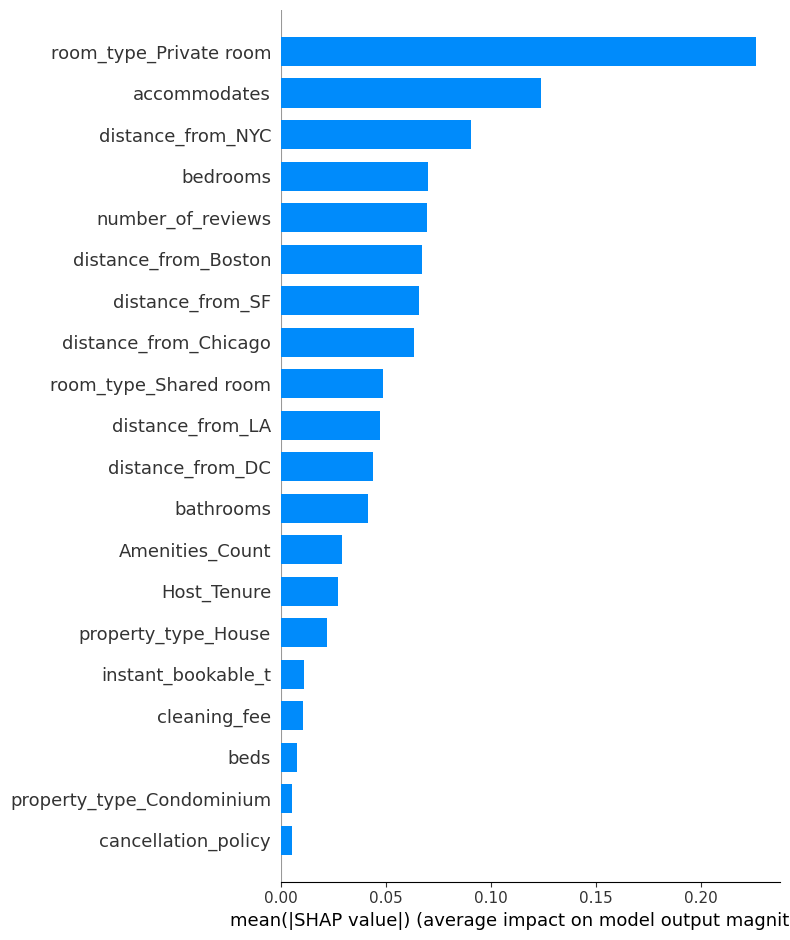

In [ ]:
import shap

explainer = shap.Explainer(main_model, X_train_final)

shap_values = explainer.shap_values(X_test_final)

# Plotting summary plot to visualize feature contributions
shap.summary_plot(shap_values, X_test_final, plot_type="bar")


 Features with higher SHAP values have a greater impact on the model predictions.
 > Features like room_type_private_room, accomodates and distance_from_nyc are the top three features that have greatest impact on the model predictions.


#**Task 10:** Predictive Performance Assessment

Root Mean Squared Error (RMSE): 0.39301467044472405
R-squared (R2) Score: 0.6906447777513944


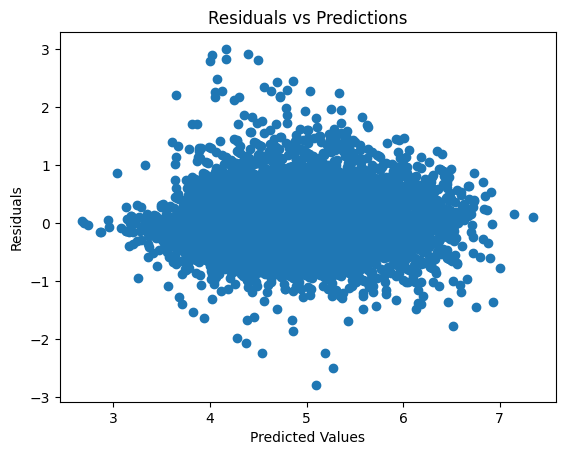

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'predictions' contains the predicted values and 'y_test' contains the true target values

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, predictions))

# Calculate R-squared
r_squared = r2_score(y_test, predictions)

# Print the evaluation metrics
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r_squared)

# Analyze residuals
residuals = y_test - predictions

# Plot residuals against predicted values
plt.scatter(predictions, residuals)
plt.title("Residuals vs Predictions")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()


*   The residuals are scattered around the x-axis, indicating that the model is not biased towards positive or negative residuals.
*   There is no clear pattern or correlation between the residuals and predicted values, suggesting that the model is not overfitting or underfitting the data.
*   The residuals are relatively small, indicating that the model is making accurate predictions.
*   The predicted values range from 3 to 7, suggesting that the model is predicting values within a specific range.
*   The residuals are both positive and negative, indicating that the model is making errors in both directions.
*   The residuals are relatively evenly distributed between positive and negative values, suggesting that the model is not consistently overestimating or underestimating the values.
*   The residuals are largest at the extremes of the predicted values, suggesting that the model may be less accurate in predicting values at the edges of the range.
*   The residuals are smallest in the middle of the predicted values, indicating that the model is most accurate in predicting values in the center of the range.
*   The residuals do not appear to be clustered around any particular predicted value, suggesting that the model is not systematically biased towards certain predictions.



#**Thank You**